In [35]:
import numpy as np
import h5py
import matplotlib.pyplot as plt
from skimage.transform import resize
import pywt     # python wavelets
from scipy.ndimage import gaussian_filter
from bm3d import bm3d
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
import glob
import csv

# The function of smoothed ℓ0 norm.

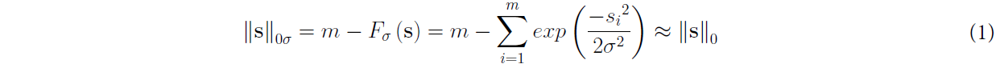

m = 1

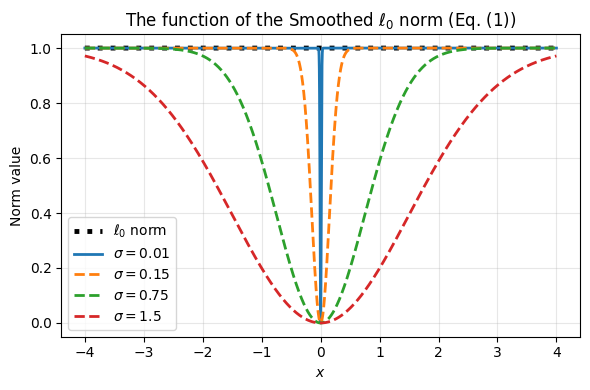

In [36]:
# --------- Eq. (1): smoothed l0 function ---------
def smooth_l0_norm(x, sigma):
    """
    Smoothed l0 norm for a scalar x, corresponding to eq. (1)
    For a single element (m=1), this is:
        g_sigma(x) = 1 - exp(-x**2 / (2 sigma**2))
    """
    return 1.0 - np.exp(-x**2 / (2.0 * sigma**2))

# --------- Visualization similar to Fig. 1 ---------
# x in [-4, 4]
x = np.linspace(-4, 4, 10000)

# sigma values (smallest behaves closest to l0)[file:1]
sigmas = [0.01, 0.15, 0.75, 1.5]
labels = [r'$\sigma={}$'.format(s) for s in sigmas]

plt.figure(figsize=(6, 4))

# (optional) ideal l0 for reference
l0 = np.zeros_like(x)
l0[np.abs(x) > 1e-6] = 1.0
plt.plot(x, l0, 'k:', linewidth=3.5, label=r'$\ell_0$ norm')

for sigma, lab in zip(sigmas, labels):
    g_sigma = smooth_l0_norm(x, sigma)

    if np.isclose(sigma, 0.01):
        # emphasize sigma=0.01 with solid line
        plt.plot(x, g_sigma, '-', linewidth=2, label=lab)
    else:
        # all other sigmas with dashed line
        plt.plot(x, g_sigma, '--', linewidth=2, label=lab)

plt.xlabel(r'$x$')
plt.ylabel('Norm value')
plt.title('The function of the Smoothed $\\ell_0$ norm (Eq. (1))')
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()



what if we make the sigma parameter smaller?

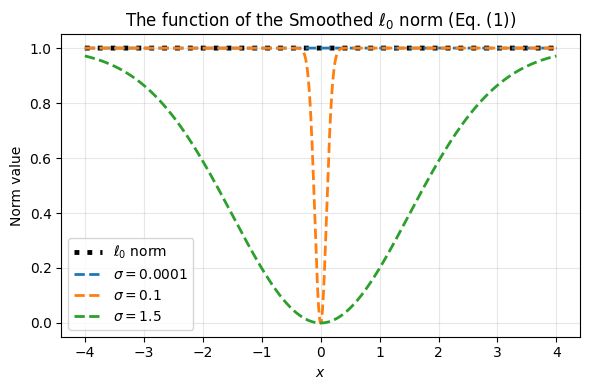

In [37]:
# --------- Eq. (1): smoothed l0 function ---------
def smooth_l0_scalar(x, sigma):
    """
    Smoothed l0 surrogate for a scalar x, corresponding to eq. (1)
    For a single element (m=1), this is:
        g_sigma(x) = 1 - exp(-x**2 / (2 sigma**2))
    """
    return 1.0 - np.exp(-x**2 / (2.0 * sigma**2))

# --------- Visualization similar to Fig. 1 ---------
def plot_smooth_l0():
    # x in [-4, 4]
    x = np.linspace(-4, 4, 10000)

    # sigma values (smallest behaves closest to l0)[file:1]
    sigmas = [0.0001, 0.1, 1.5]
    labels = [r'$\sigma={}$'.format(s) for s in sigmas]

    plt.figure(figsize=(6, 4))

    # (optional) ideal l0 for reference
    l0 = np.zeros_like(x)
    l0[np.abs(x) > 1e-6] = 1.0
    plt.plot(x, l0, 'k:', linewidth=3.5, label=r'$\ell_0$ norm')

    for sigma, lab in zip(sigmas, labels):
        g_sigma = smooth_l0_scalar(x, sigma)

        if np.isclose(sigma, 0.01):
            # emphasize sigma=0.01 with solid line
            plt.plot(x, g_sigma, '-', linewidth=2, label=lab)
        else:
            # all other sigmas with dashed line
            plt.plot(x, g_sigma, '--', linewidth=2, label=lab)

    plt.xlabel(r'$x$')
    plt.ylabel('Norm value')
    plt.title('The function of the Smoothed $\\ell_0$ norm (Eq. (1))')
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

if __name__ == '__main__':
    plot_smooth_l0()

We see that ℓ0 norm and sigma = 0.0001 are now alike.

# Helper functions:

## 1 Unitary FFT

In [38]:
# ---------- FFT helpers ----------
def fft2c(img):
    return np.fft.fftshift(np.fft.fft2(np.fft.ifftshift(img))) / np.sqrt(np.prod(img.shape))

def ifft2c(kspace):
    return np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(kspace))) * np.sqrt(np.prod(kspace.shape))


## 2 load image and k-space

In [39]:
# ---------- Load knee slice and resize k-space to 256x256 ----------
def load_rss_image_kspace_256(h5_path, slice_index='middle'):
    with h5py.File(h5_path, 'r') as f:
        rss = f['reconstruction_rss'][()]   # [nslices, ny, nx]
    nslices, ny, nx = rss.shape

    if slice_index == 'middle':
        si = nslices // 2
    else:
        si = int(slice_index)

    img = rss[si].astype(float)

    # resize image to 256x256
    img_res = resize(img, (256, 256), anti_aliasing=True)

    # k-space of this resized image
    k_res = fft2c(img_res)
    return img_res, k_res

## 3 Sampling Mask functions

### 3.1 Square mask

In [40]:
def square_mask(shape, frac):
    ny, nx = shape
    total = ny * nx
    keep = int(total * frac)

    side = int(np.sqrt(keep))

    cy, cx = ny // 2, nx // 2
    half = side // 2

    y_start = max(0, cy - half)
    y_end   = min(ny, cy + half + (side % 2))
    x_start = max(0, cx - half)
    x_end   = min(nx, cx + half + (side % 2))

    mask = np.zeros((ny, nx), dtype=float)
    mask[y_start:y_end, x_start:x_end] = 1.0
    return mask

### 3.2 Spiral mask

In [41]:
def spiral_mask(shape, frac,  seed=0):
    """
    Variable-density Archimedean spiral mask for MRI compressed sensing.
    
    Parameters:
        shape        : (ny, nx) k-space size
        frac         : target sampling fraction (0..1)
        n_arms       : number of interleaved spiral arms
        center_frac  : fraction of radius to fully sample (DC component)
        seed         : random seed for reproducibility
    
    Returns:
        mask (ny, nx) binary float array with exactly frac*ny*nx ones
    """
    n_arms=10
    center_frac=0.1

    ny, nx = shape
    cy, cx = ny // 2, nx // 2
    max_r = min(cy, cx) - 1
    total_pts = ny * nx
    target_pts = int(round(total_pts * frac))
    
    # ---- distance map from k-space center ----
    yy, xx = np.ogrid[:ny, :nx]
    dist_map = np.hypot(yy - cy, xx - cx)          # (ny, nx)

    # ====== STEP 1: FULLY SAMPLE DC CENTER DISK ======
    r_center = max(1, int(max_r * center_frac))
    center_disk = dist_map <= r_center              # boolean
    
    mask = np.zeros((ny, nx), dtype=np.float32)
    mask[center_disk] = 1.0
    
    used_pts = int(mask.sum())
    remaining = target_pts - used_pts
    
    if remaining <= 0:
        return mask.astype(float)

    # ====== STEP 2: ARCHIMEDEAN SPIRAL ARMS ======
    # r(θ) = (max_r - r_center) * (θ / θ_max)
    # Start each arm at circle edge, reach max_r at end
    
    n_pts_per_arm = max(nx * 4, remaining * 3)       # oversample trajectory
    theta_max = 4 * np.pi                            # 2 full turns per arm
    theta = np.linspace(0, theta_max, n_pts_per_arm)
    
    # Strictly linear Archimedean: r grows from r_center to max_r
    r_traj = r_center + (max_r - r_center) * (theta / theta_max)
    
    collected = set()
    
    for arm in range(n_arms):
        # Uniform angular offset between arms
        phi0 = 2 * np.pi * arm / n_arms
        
        x = cx + r_traj * np.cos(theta + phi0)
        y = cy + r_traj * np.sin(theta + phi0)
        
        xi = np.clip(np.round(x).astype(int), 0, nx - 1)
        yi = np.clip(np.round(y).astype(int), 0, ny - 1)
        
        for yp, xp in zip(yi, xi):
            if not center_disk[yp, xp]:             # skip already-filled center
                collected.add((yp, xp))
    
    # ====== STEP 3: EXACT COVERAGE TRIM ======
    if len(collected) == 0:
        return mask.astype(float)
    
    pts = np.array(list(collected))                 # (N, 2)
    dists = np.hypot(pts[:, 0] - cy, pts[:, 1] - cx)
    
    # Sort center-first → fills inward then outward
    order = np.argsort(dists)
    
    need = min(remaining, len(order))
    keep = pts[order[:need]]
    
    mask[keep[:, 0], keep[:, 1]] = 1.0
    
    # ====== STEP 4: HANDLE UNDER-SAMPLING (RARE) ======
    got = int(mask.sum())
    shortfall = target_pts - got
    if shortfall > 0:
        # Fill remaining gap with next-closest unsampled points
        unsampled = np.argwhere(mask == 0)
        d_uns = np.hypot(unsampled[:, 0] - cy, unsampled[:, 1] - cx)
        extra = unsampled[np.argsort(d_uns)[:shortfall]]
        mask[extra[:, 0], extra[:, 1]] = 1.0
    
    return mask.astype(float)

### 3.3 Cartesian mask

In [42]:
def cartesian_mask(shape, frac, center_frac=0.06, axis=0, seed=0):
    """
    Variable-density Cartesian mask:
    - Fully sampled center region
    - Random sparse sampling in outer regions
    
    - shape: (ny, nx)
    - frac: total sampling fraction
    - center_frac: fraction of center to fully sample
    - axis: 0 for horizontal lines (undersample ky/rows), 
            1 for vertical lines (undersample kx/columns)
    - seed: random seed
    """
    ny, nx = shape
    rng = np.random.RandomState(seed)
    mask = np.zeros(shape, dtype=float)
    
    if axis == 0:
        # Sample rows (horizontal lines in the mask)
        n_total = ny
        center_idx = ny // 2
    else:
        # Sample columns (vertical lines in the mask)
        n_total = nx
        center_idx = nx // 2
    
    # 1) Fully sampled center block
    n_center = max(1, int(n_total * center_frac))
    half = n_center // 2
    center_start = center_idx - half
    center_end = center_idx + half + (n_center % 2)
    
    if axis == 0:
        mask[center_start:center_end, :] = 1.0
    else:
        mask[:, center_start:center_end] = 1.0
    
    # 2) Random undersampling in outer regions
    n_total_keep = int(n_total * frac)
    n_center_actual = center_end - center_start
    n_outer_keep = max(0, n_total_keep - n_center_actual)
    
    if n_outer_keep > 0:
        # Outer indices
        outer_idx = list(range(0, center_start)) + list(range(center_end, n_total))
        
        if len(outer_idx) > 0:
            n_sample = min(n_outer_keep, len(outer_idx))
            selected = rng.choice(outer_idx, size=n_sample, replace=False)
            
            if axis == 0:
                mask[selected, :] = 1.0
            else:
                mask[:, selected] = 1.0
    
    return mask

### 3.4 Random 2d mask

In [43]:
def random_2d_mask(shape, frac=0.1, seed=0):
    ny, nx = shape
    rng = np.random.RandomState(seed)
    mask = (rng.rand(ny, nx) < frac)
    return mask.astype(float)

### 3.5 Variable density Random 2d mask

In [44]:
def var_den_random_2d_mask(shape, frac, seed=0, center_frac=0.08, decay=1):
    """
    Variable-density random mask for MRI compressed sensing.
    
    Parameters:
        shape       : (ny, nx)
        frac        : target sampling fraction
        center_frac : fraction of radius to fully sample (DC disk)
        decay       : controls how fast density drops from center (higher = faster decay)
    
    Returns:
        mask (ny, nx) float with EXACTLY frac*ny*nx ones
    """
    ny, nx = shape
    cy, cx = ny // 2, nx // 2
    max_r = min(cy, cx) - 1
    
    total_pts = ny * nx
    target_pts = int(round(total_pts * frac))
    
    rng = np.random.RandomState(seed)
    
    # ====== STEP 1: DISTANCE MAP ======
    yy, xx = np.ogrid[:ny, :nx]
    dist_map = np.hypot(yy - cy, xx - cx)           # (ny, nx)
    r_norm = dist_map / max_r                        # normalized [0..1]
    r_norm = np.clip(r_norm, 0, 1)
    
    # ====== STEP 2: FULLY SAMPLE DC CENTER DISK ======
    r_center = max(1, int(max_r * center_frac))
    center_disk = dist_map <= r_center
    
    mask = np.zeros((ny, nx), dtype=float)
    mask[center_disk] = 1.0
    
    # ====== STEP 3: VARIABLE-DENSITY PROBABILITY MAP ======
    # p(r) = (1 - r_norm)^decay → high at center, decays outward
    prob = (1.0 - r_norm) ** decay
    prob[center_disk] = 0.0                          # already sampled
    
    # Normalize prob so expected samples = remaining target
    used_pts = int(mask.sum())
    remaining = target_pts - used_pts
    
    if remaining <= 0:
        return mask
    
    # Scale probabilities to get roughly remaining samples
    prob_sum = prob.sum()
    if prob_sum > 0:
        prob = prob * (remaining / prob_sum)
        prob = np.clip(prob, 0.0, 1.0)
    
    # ====== STEP 4: RANDOM DRAW ======
    rand_draw = rng.rand(ny, nx)
    sampled = (rand_draw < prob) & (~center_disk.astype(bool))
    mask[sampled] = 1.0
    
    # ====== STEP 5: EXACT COVERAGE ======
    current_pts = int(mask.sum())
    
    if current_pts > target_pts:
        # Remove excess: farthest unprotected points first
        excess = current_pts - target_pts
        candidates = np.argwhere((mask > 0) & ~center_disk)
        dists = np.hypot(candidates[:, 0] - cy, candidates[:, 1] - cx)
        remove_idx = np.argsort(dists)[-excess:]     # remove farthest
        mask[candidates[remove_idx, 0], candidates[remove_idx, 1]] = 0.0
    
    elif current_pts < target_pts:
        # Add missing: closest unsampled points first
        shortfall = target_pts - current_pts
        candidates = np.argwhere(mask == 0)
        dists = np.hypot(candidates[:, 0] - cy, candidates[:, 1] - cx)
        add_idx = np.argsort(dists)[:shortfall]      # add closest
        mask[candidates[add_idx, 0], candidates[add_idx, 1]] = 1.0
    
    return mask


### 3.6 Pseudo radial mask

In [45]:
def pseudo_radial_mask(shape, frac):
    """
    Pseudo-radial mask with EXACT frac coverage.
    
    - Compensates spoke overlap (~10% for frac=0.5)
    - Scales spokes to hit target exactly
    """
    ny, nx = shape
    total_pixels = ny * nx
    cy, cx = ny // 2, nx // 2
    mask = np.zeros((ny, nx), dtype=float)

    # Empirical overlap factor (spokes overlap ~8-12%)
    overlap_factor = 1.11  # For 256x256, frac=0.5 → ~45.5% raw → scale up
    target_points = int(total_pixels * frac * overlap_factor)
    
    # Max spokes for dense coverage
    max_spokes = ny
    n_spokes = max(4, int(max_spokes * frac * overlap_factor))
    
    r_max = int(np.hypot(cy, cx))
    angles = np.linspace(0, np.pi, n_spokes, endpoint=False)

    for theta in angles:
        r = np.linspace(-r_max, r_max, 2 * r_max + 1)
        x = cx + r * np.cos(theta)
        y = cy + r * np.sin(theta)

        x = np.round(x).astype(int)
        y = np.round(y).astype(int)

        valid = (x >= 0) & (x < nx) & (y >= 0) & (y < ny)
        x, y = x[valid], y[valid]

        mask[y, x] = 1.0

    # TRIM to EXACT frac (remove center if needed)
    current_coverage = np.sum(mask) / total_pixels
    if current_coverage > frac + 1e-4:
        # Sort by distance from center (prefer removing outer points)
        y_idx, x_idx = np.nonzero(mask)
        distances = np.hypot(x_idx - cx, y_idx - cy)
        
        # Remove excess points starting from farthest
        excess = int((current_coverage - frac) * total_pixels)
        farthest_idx = np.argsort(distances)[-excess:]
        
        mask[y_idx[farthest_idx], x_idx[farthest_idx]] = 0

    return mask


## 4 Visualization: mask + k-space + image

In [46]:
# ---------- Visualization: mask + k-space + image ----------
def show_mask_kspace_image(mask, kspace, title_prefix):
    k_masked = mask * kspace

    img_rec = np.abs(ifft2c(k_masked))

    kspace_log = np.log(np.abs(k_masked))  # Convert to dB

    plt.figure(figsize=(9, 3))

    # 1) Binary mask
    plt.subplot(1, 3, 1)
    plt.imshow(mask, cmap='gray', vmin=0, vmax=1)
    plt.title(f'{title_prefix} mask')
    plt.axis('on')

    # 2) Masked k-space (log)
    plt.subplot(1, 3, 2)
    plt.imshow(kspace_log)
    plt.title(f'{title_prefix} k-space (log)')
    plt.axis('on')

    # 3) Zero-filled image
    plt.subplot(1, 3, 3)
    plt.imshow(img_rec, cmap='gray')
    plt.title(f'{title_prefix} image')
    plt.axis('on')

    plt.tight_layout()
    plt.show()


## 5 Wavelet transforms

In [47]:
# ---------- Wavelet transform (orthonormal) ----------
def wavelet_forward(img, wavelet='haar', level=4):
    # returns concatenated coefficients and bookkeeping structure
    coeffs2 = pywt.wavedec2(img, wavelet=wavelet, level=level, mode='periodization')
    arr, slices = pywt.coeffs_to_array(coeffs2)
    return arr, slices

def wavelet_inverse(arr, slices, wavelet='haar'):
    coeffs2 = pywt.array_to_coeffs(arr, slices, output_format='wavedec2')
    img = pywt.waverec2(coeffs2, wavelet=wavelet, mode='periodization')
    return img

## Outer Loop algorithms

### 6 Denoisers

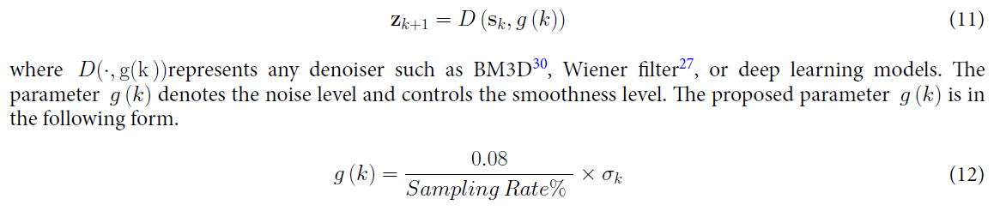

#### 6.1 BM3D

In [48]:
# ---------- Denoiser ----------
def denoise_bm3d_complex(s, sigma):
    # Separate mag and phase
    mag = np.abs(s)
    phase = np.exp(1j * np.angle(s))
    
    # Normalize
    m_min, m_max = mag.min(), mag.max()
    mag_norm = (mag - m_min) / (m_max - m_min)

    # Denoise the mag
    den = bm3d(mag_norm, sigma_psd=sigma)

    # convert denoised mag to the initial scale
    den = den * (m_max - m_min) + m_min
    return den * phase

#### 6.2 Wiener

In [49]:
def denoise_wiener_complex_scipy(s, sigma, kernel_size=5):
    from scipy.signal import wiener
    
    mag = np.abs(s)
    phase = np.exp(1j * np.angle(s))
    
    # Normalize
    m_min, m_max = mag.min(), mag.max()
    mag_norm = (mag - m_min) / (m_max - m_min)

    # Apply Wiener filter
    den = wiener(mag_norm, mysize=kernel_size, noise=sigma**2)
    
    # Denormalize
    den = den * (m_max - m_min) + m_min
    
    return den * phase

### 7 Sharpener

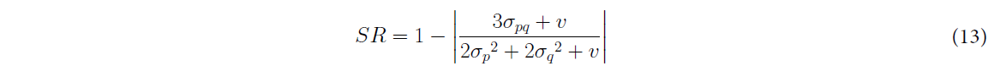

In [50]:
# ---------- Sharpening ----------
def compute_SR(z, s_prev, v=1e-6):
    z_mag = np.abs(z)
    s_mag = np.abs(s_prev)
    mu_p  = gaussian_filter(z_mag, sigma=1)
    mu_q  = gaussian_filter(s_mag, sigma=1)
    mu_p2 = gaussian_filter(z_mag**2, sigma=1)
    mu_q2 = gaussian_filter(s_mag**2, sigma=1)
    mu_pq = gaussian_filter(z_mag * s_mag, sigma=1)

    sigma_p2 = np.clip(mu_p2 - mu_p**2, 0, None)
    sigma_q2 = np.clip(mu_q2 - mu_q**2, 0, None)
    sigma_pq = mu_pq - mu_p * mu_q

    num = 3 * sigma_pq + v
    den = 2 * sigma_p2 + 2 * sigma_q2 + v
    SR = 1.0 - np.abs(num / den)
    return SR

### 8 Implement denoise and sharpen

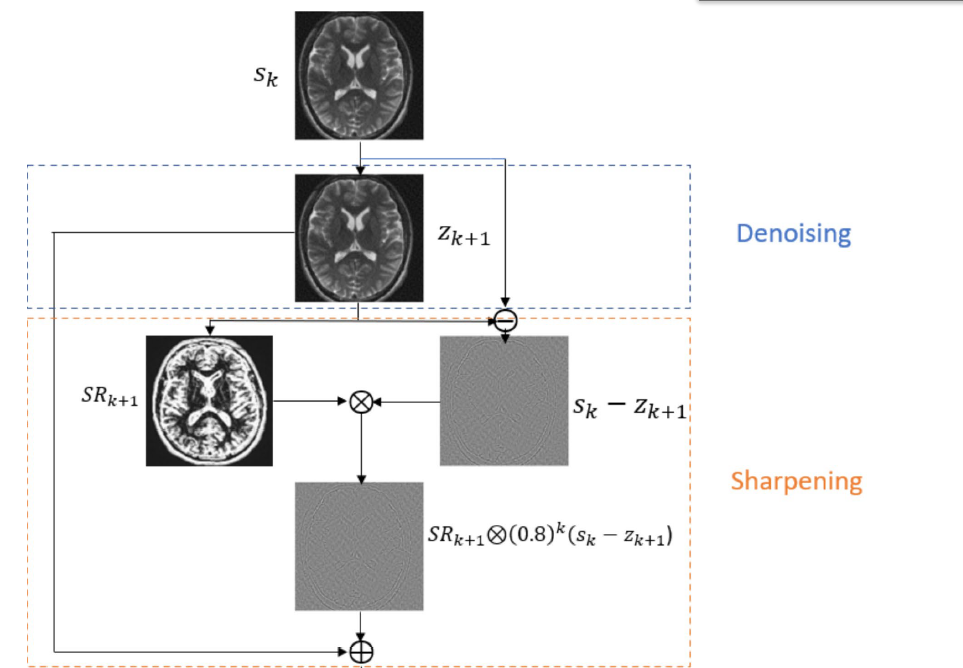

In [51]:
def denoise_and_sharpen(s_prev, sigma_k, sampling_rate, k_outer, denoiser):
    # g(k) from eq. (12)
    gk = 0.08 / (sampling_rate * 100.0) * sigma_k  
    
    # Step 1: Denoise
    if denoiser == 'BM3D':
        z = denoise_bm3d_complex(s_prev, sigma=gk)
        
    elif denoiser == 'wiener':
        z = denoise_wiener_complex_scipy(s_prev, sigma=gk)
    
    # # Step 2: sharpening
    SR = compute_SR(z, s_prev)

    z = z + SR * (0.8 ** k_outer) * (s_prev - z)  # Sharpen denoised z
 
    return z


## 9 Inner Loop gradient descent

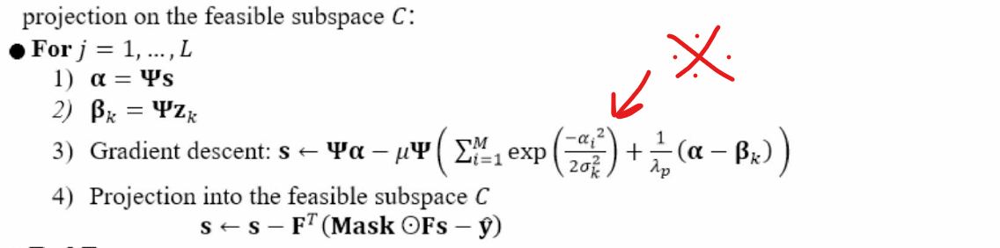

the formula is wrong!! the correct one:

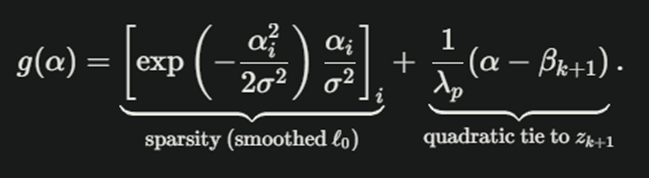

In [52]:
def sl0_gradient_step(s, z_k, sigma_k, lam_p, mu, mask, y_hat,
                      wavelet='haar', level=4):
    
    """
    gradient decent + projection step (inner loop).
    s, z_k: complex images
    sigma_k: current sigma
    lam_p: penalty lambda
    mu: gradient step size
    mask: undersampling mask (0/1)
    y_hat: zero-padded kspace measurements
    """
    # the function is vectorized over all wavelet coefficients so we dont need the ∑ from i to M

    alpha, slices = wavelet_forward(s, wavelet=wavelet, level=level)
    beta, _       = wavelet_forward(z_k, wavelet=wavelet, level=level)

    grad_l0 = np.exp(-alpha**2 / (2.0 * sigma_k**2)) * alpha / (sigma_k**2)

    grad_reg = (alpha - beta) / lam_p
    g_alpha = grad_l0 + grad_reg

    alpha_new = alpha - mu * g_alpha    # the updated wavelet coefficient of s (alpha)
 
    s_new = wavelet_inverse(alpha_new, slices, wavelet=wavelet) # lets get the new s out of the updated alpha

    Fs = fft2c(s_new)       # k-space of current s
    s_proj = s_new - ifft2c(mask * Fs - y_hat)   #y_hat: 0 padded version of sampled kspace (mask * k_full)
    return s_proj

## 10 ISRL0 algorithm

In [53]:
def ISRL0_reconstruct(k_full,
                            sampling_rate=0.3,
                            sigma_list=None,
                            lam_p=0.05,
                            mu=0.3,
                            L=2,
                            wavelet='haar',
                            level=4,
                            seed=0,
                            denoiser_method='BM3D',
                            mask_type = 'pseudo_radial'):
    ny, nx = k_full.shape

    if mask_type == 'square':
        mask = square_mask((ny, nx), frac=sampling_rate)

    if mask_type == 'spiral':
        mask = spiral_mask((ny, nx), frac=sampling_rate, seed=0) 

    if mask_type == 'cartesian_kx':
        mask = cartesian_mask((ny, nx), frac=sampling_rate, center_frac=0.1, axis=0, seed=0)

    if mask_type == 'cartesian_ky':
        mask = cartesian_mask((ny, nx), frac=sampling_rate, center_frac=0.1, axis=1, seed=0)

    if mask_type == 'random':
        mask = random_2d_mask((ny, nx), frac=sampling_rate, seed=0)

    if mask_type == 'vd_random':
        mask = var_den_random_2d_mask((ny, nx), frac=sampling_rate, seed=0)

    if mask_type == 'pseudo_radial':
        mask = pseudo_radial_mask((ny, nx), frac=sampling_rate)

    y_hat = mask * k_full

    # s0 = A† y = IFFT2(y_hat)
    s_prev = ifft2c(y_hat)

    if sigma_list is None:
        sigma_list = [2.0, 1.0, 0.5, 0.25, 0.12]

    for k, sigma_k in enumerate(sigma_list, start=1):
        z_k = denoise_and_sharpen(s_prev, sigma_k, sampling_rate, k_outer=k, denoiser=denoiser_method)
        s_inner = s_prev.copy()
        # lam_p = np.exp(sigma_k)
        for _ in range(L):
            s_inner = sl0_gradient_step(s_inner, z_k, sigma_k,
                                        lam_p, mu, mask, y_hat,
                                        wavelet=wavelet, level=level)
        s_prev = s_inner
        
    img_rec = np.abs(s_prev)
    return img_rec, mask

## 11 Evaluate Reconstruction

In [54]:
# ---------- Metrics: PSNR, HFEN, SSIM ----------
def compute_hfen(x, x_hat, sigma_hp=0.35):

    x_blur = gaussian_filter(x, sigma=sigma_hp)     # low pass gaussian filter
    xh = x - x_blur
    xhat_blur = gaussian_filter(x_hat, sigma=sigma_hp)
    xh_hat = x_hat - xhat_blur
    return np.linalg.norm(xh - xh_hat)

def evaluate_reconstruction(img_ref, img_rec):
    ref = img_ref
    rec = img_rec
    ref = ref / (ref.max() + 1e-8)
    rec = rec / (rec.max() + 1e-8)
    psnr = peak_signal_noise_ratio(ref, rec, data_range=1)   # eq. (26)
    ssim = structural_similarity(ref, rec, data_range=1)
    hfen = compute_hfen(ref, rec)                              # eq. (27)
    return psnr, hfen, ssim

## SL0 functions

### normal fft

In [55]:
def normal_fft2(x):
    """Centered 2D FFT"""
    return np.fft.fftshift(np.fft.fft2(np.fft.ifftshift(x)))

def normal_ifft2(x):
    """Centered 2D IFFT"""
    return np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(x)))


### SL0 reconstruct

In [34]:
def SL0_reconstruct(k_full, mask, sigma_min=0.01, sigma_max=2.0, 
                     sigma_decrease_factor=0.5, mu_0=2, L=3, max_iters=100):
    """
    Standard SL0 algorithm for CS-MRI reconstruction
    
    Parameters:
    -----------
    k_full : array
        Full k-space data
    mask : array
        Undersampling mask
    sigma_min : float
        Final smoothing parameter (smaller = better L0 approximation)
    sigma_max : float
        Initial smoothing parameter (larger = smoother, more convex)
    sigma_decrease_factor : float
        Factor to decrease sigma at each outer iteration
    mu_0 : float
        Step size for steepest descent
    L : int
        Number of inner iterations per sigma value
    max_iters : int
        Maximum total iterations
    
    Returns:
    --------
    img_rec : array
        Reconstructed image
    """
    # Initialize with zero-filled reconstruction
    k_masked = k_full * mask
    x = ifft2c(k_masked)
    
    # Sigma schedule (graduated non-convexity)
    sigma = sigma_max
    iteration = 0
    
    while sigma > sigma_min and iteration < max_iters:
        # Inner loop: Steepest descent for current sigma
        for _ in range(L):
            # Compute gradient of smoothed L0 norm
            # F_sigma(x) = sum(exp(-|x_i|^2 / (2*sigma^2)))
            # Gradient: dF/dx = -(x / sigma^2) * exp(-|x|^2 / (2*sigma^2))
            
            x_abs_sq = np.abs(x)**2
            exp_term = np.exp(-x_abs_sq / (2 * sigma**2))
            gradient = -(x / (sigma**2)) * exp_term
            
            # Steepest descent step
            x = x - mu_0 * gradient
            
            # Data consistency projection: enforce measured k-space values
            k_current = normal_fft2(x)
            k_current = k_current * (1 - mask) + k_masked  # Keep measured data
            x = normal_ifft2(k_current)
        
        # Decrease sigma (graduated non-convexity)
        sigma = sigma * sigma_decrease_factor
        iteration += L
    
    return np.abs(x)

# Tests and examples

## compare different masking methods for one knee image

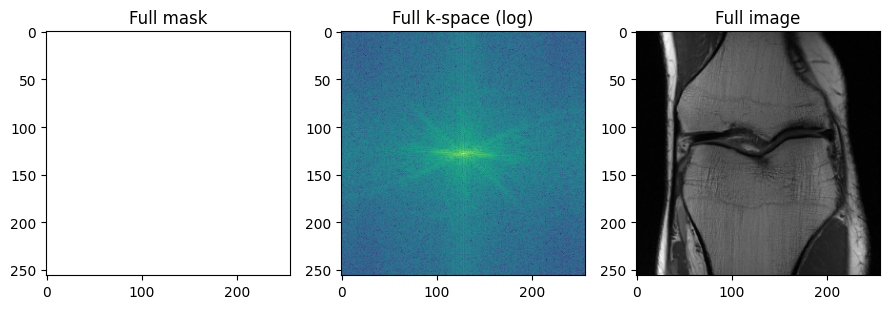

coverage: 100.00%


C:\Users\Sepi\AppData\Local\Temp\ipykernel_45312\1175173080.py:7: RuntimeWarning: divide by zero encountered in log
  kspace_log = np.log(np.abs(k_masked))  # Convert to dB


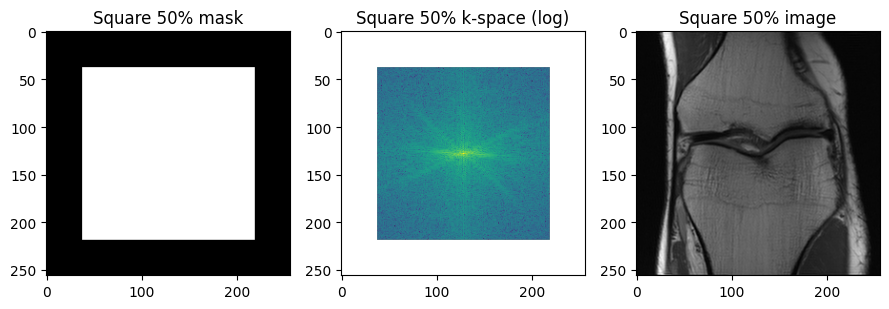

coverage: 49.99%


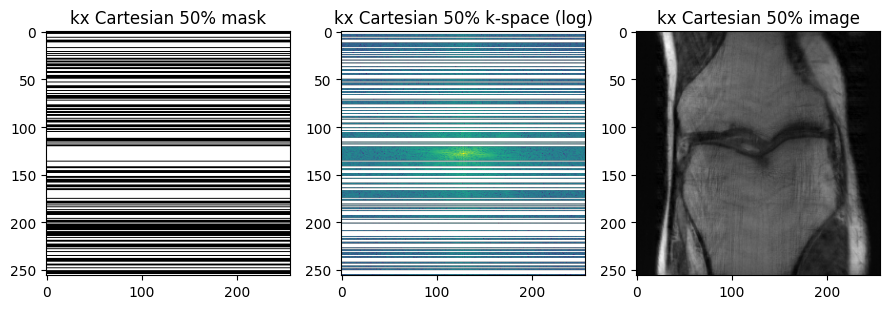

coverage: 50.00%


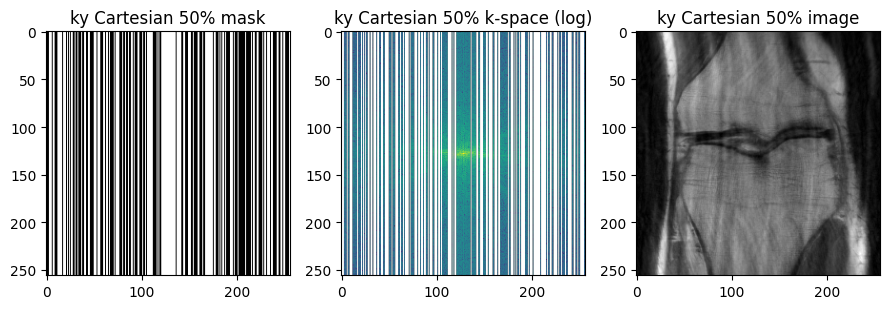

coverage: 50.00%


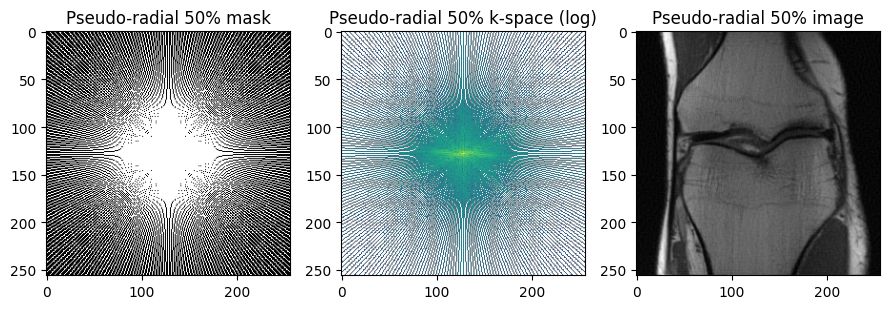

coverage: 49.82%


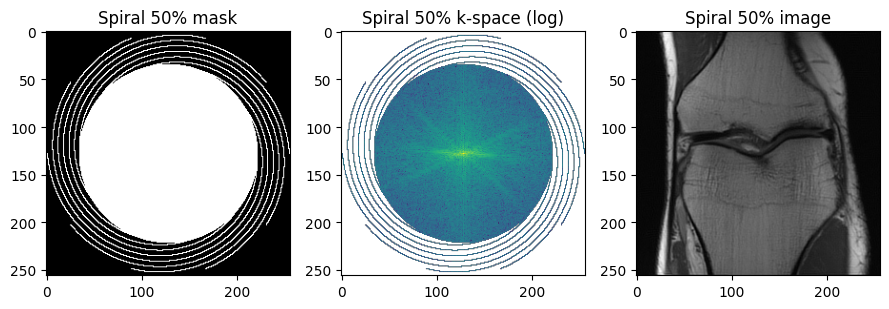

coverage: 50.00%


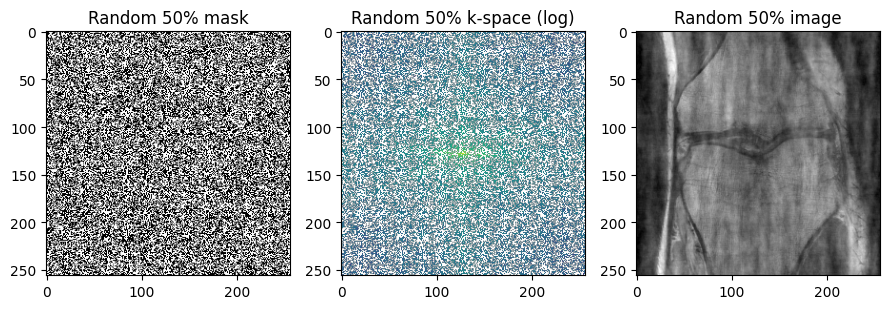

coverage: 50.13%


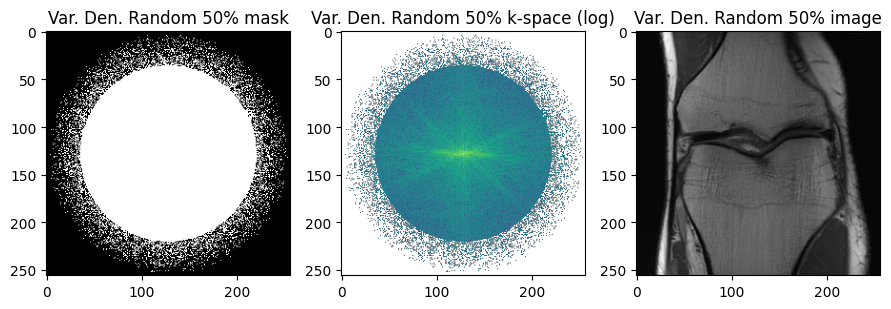

coverage: 50.00%


In [57]:
h5_path = "C:/Users/Sepi/Desktop/Sepehr/UNIVERSITY/Uni Master aut/Term 1/Medical Imaging/project/fastMRI-data/knee_singlecoil_val/20 samples/file1000041.h5"
sampl = 0.5     # kspace sampling rate

img_256, k_full_256 = load_rss_image_kspace_256(h5_path)

nx = 256

# Full (no mask): just show k-space+image; mask is all ones
full_mask = np.ones_like(k_full_256, dtype=float)
show_mask_kspace_image(full_mask, k_full_256, 'Full')
print(f"coverage: {100*full_mask.sum()/nx/nx:.2f}%")

# square
sq_mask = square_mask(k_full_256.shape, frac=sampl)
show_mask_kspace_image(sq_mask, k_full_256, f'Square {int(sampl*100)}%')
print(f"coverage: {100*sq_mask.sum()/nx/nx:.2f}%")

# kx Cartesian undersampling
cart_mask = cartesian_mask(k_full_256.shape, frac=sampl,  axis=0, seed=0)
show_mask_kspace_image(cart_mask, k_full_256, f'kx Cartesian {int(sampl*100)}%')
print(f"coverage: {100*cart_mask.sum()/nx/nx:.2f}%")

# ky Cartesian undersampling
cart_mask = cartesian_mask(k_full_256.shape, frac=sampl, axis=1, seed=0)
show_mask_kspace_image(cart_mask, k_full_256, f'ky Cartesian {int(sampl*100)}%')
print(f"coverage: {100*cart_mask.sum()/nx/nx:.2f}%")

# Pseudo-radial
prad_mask = pseudo_radial_mask(k_full_256.shape, frac=sampl)
show_mask_kspace_image(prad_mask, k_full_256, f'Pseudo-radial {int(sampl*100)}%')
print(f"coverage: {100*prad_mask.sum()/nx/nx:.2f}%")

    # Spiral
spir_mask = spiral_mask(k_full_256.shape, frac=sampl, seed=0)
show_mask_kspace_image(spir_mask, k_full_256, f'Spiral {int(sampl*100)}%')
print(f"coverage: {100*spir_mask.sum()/nx/nx:.2f}%")

# Random 2D
rand_mask = random_2d_mask(k_full_256.shape, frac=sampl, seed=0)
show_mask_kspace_image(rand_mask, k_full_256, f'Random {int(sampl*100)}%')
print(f"coverage: {100*rand_mask.sum()/nx/nx:.2f}%")

# Variable density Random 2D
rand_mask = var_den_random_2d_mask(k_full_256.shape, frac=sampl, seed=0)
show_mask_kspace_image(rand_mask, k_full_256, f'Var. Den. Random {int(sampl*100)}%')
print(f"coverage: {100*rand_mask.sum()/nx/nx:.2f}%")

## compare different masking methods for one brain image

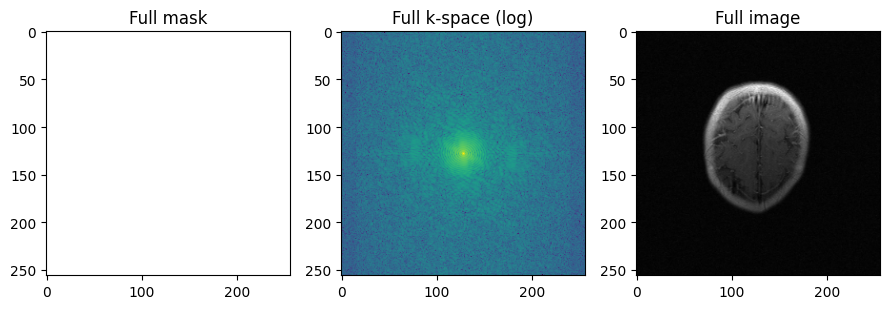

coverage: 0.99%


C:\Users\Sepi\AppData\Local\Temp\ipykernel_50704\1175173080.py:7: RuntimeWarning: divide by zero encountered in log
  kspace_log = np.log(np.abs(k_masked))  # Convert to dB


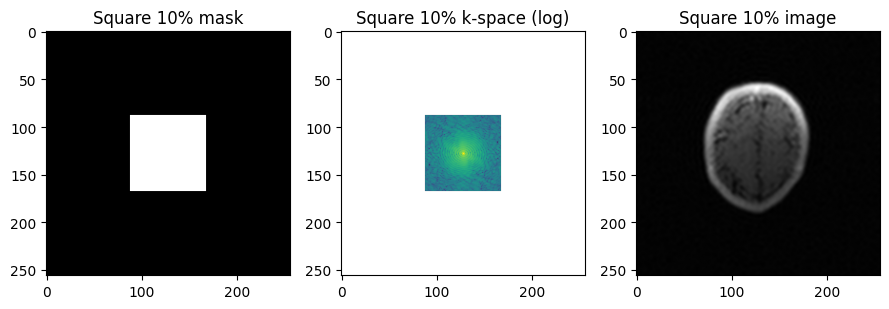

coverage: 0.10%


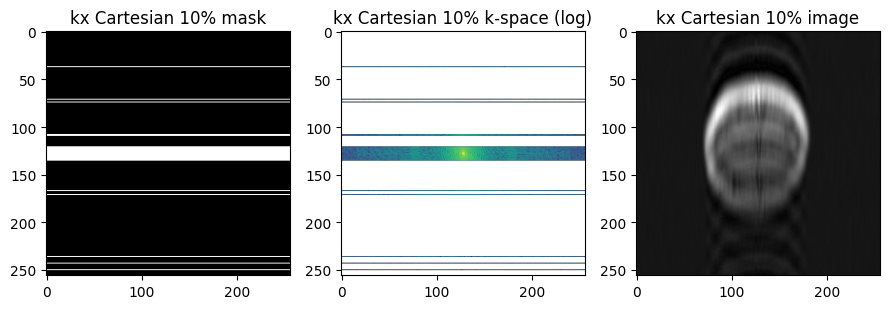

coverage: 0.10%


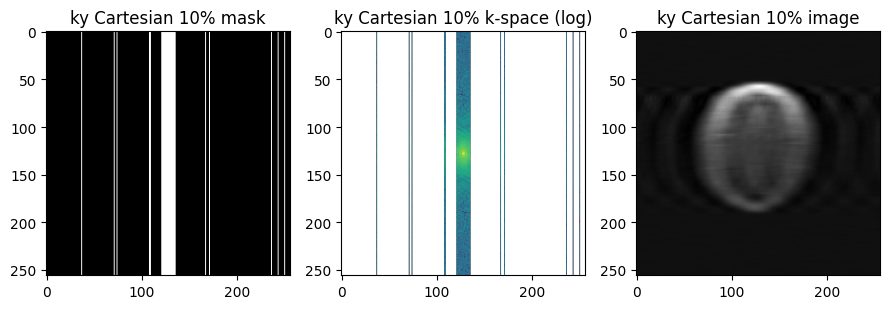

coverage: 0.10%


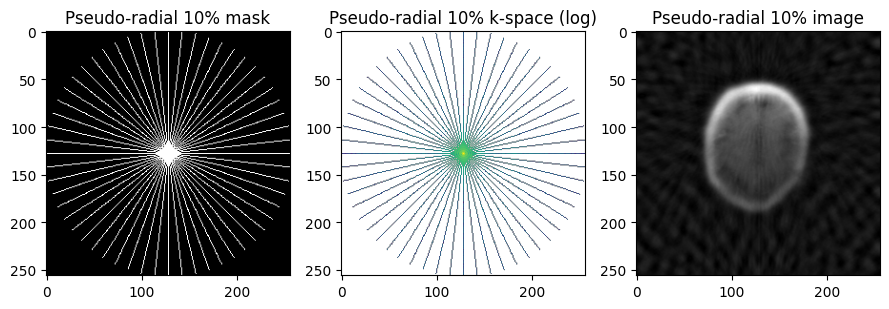

coverage: 0.10%


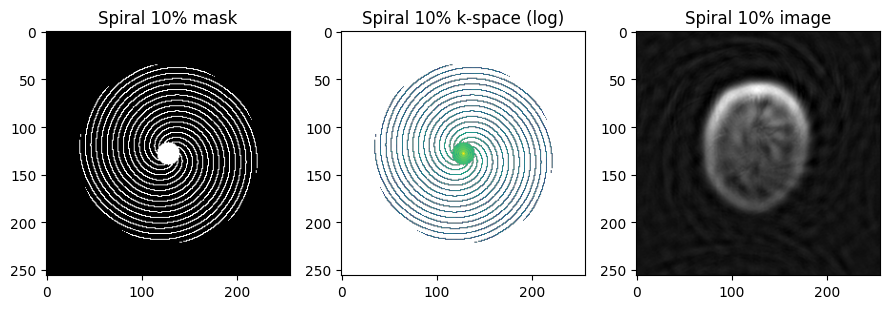

coverage: 0.10%


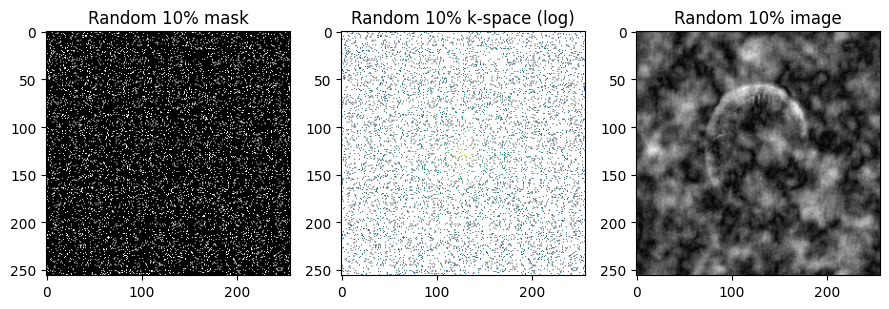

coverage: 0.10%


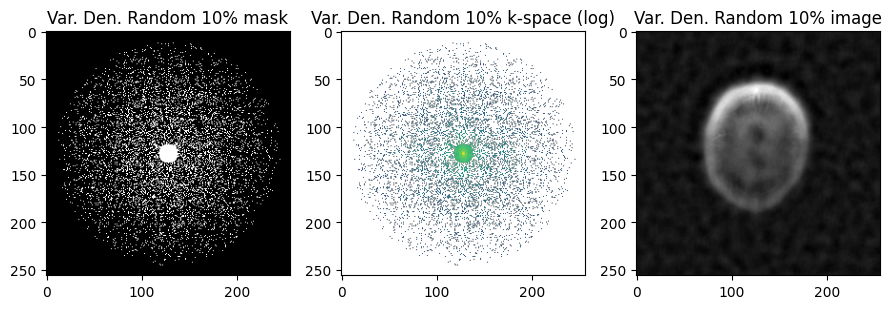

coverage: 0.10%


In [142]:
file_path = "C:/Users/Sepi/Desktop/Sepehr/UNIVERSITY/Uni Master aut/Term 1/Medical Imaging/project/fastMRI-data/brain train/multicoil_train/T1/file_brain_AXT1_202_2020195.h5"

sampl = 0.1     # kspace sampling rate

img_256, k_full_256 = load_rss_image_kspace_256(file_path, slice_index=10)

nx = 2567

# Full (no mask): just show k-space+image; mask is all ones
full_mask = np.ones_like(k_full_256, dtype=float)
show_mask_kspace_image(full_mask, k_full_256, 'Full')
print(f"coverage: {100*full_mask.sum()/nx/nx:.2f}%")

# square
sq_mask = square_mask(k_full_256.shape, frac=sampl)
show_mask_kspace_image(sq_mask, k_full_256, f'Square {int(sampl*100)}%')
print(f"coverage: {100*sq_mask.sum()/nx/nx:.2f}%")

# kx Cartesian undersampling
cart_mask = cartesian_mask(k_full_256.shape, frac=sampl,  axis=0, seed=0)
show_mask_kspace_image(cart_mask, k_full_256, f'kx Cartesian {int(sampl*100)}%')
print(f"coverage: {100*cart_mask.sum()/nx/nx:.2f}%")

# ky Cartesian undersampling
cart_mask = cartesian_mask(k_full_256.shape, frac=sampl, axis=1, seed=0)
show_mask_kspace_image(cart_mask, k_full_256, f'ky Cartesian {int(sampl*100)}%')
print(f"coverage: {100*cart_mask.sum()/nx/nx:.2f}%")

# Pseudo-radial
prad_mask = pseudo_radial_mask(k_full_256.shape, frac=sampl)
show_mask_kspace_image(prad_mask, k_full_256, f'Pseudo-radial {int(sampl*100)}%')
print(f"coverage: {100*prad_mask.sum()/nx/nx:.2f}%")

    # Spiral
spir_mask = spiral_mask(k_full_256.shape, frac=sampl, seed=0)
show_mask_kspace_image(spir_mask, k_full_256, f'Spiral {int(sampl*100)}%')
print(f"coverage: {100*spir_mask.sum()/nx/nx:.2f}%")

# Random 2D
rand_mask = random_2d_mask(k_full_256.shape, frac=sampl, seed=0)
show_mask_kspace_image(rand_mask, k_full_256, f'Random {int(sampl*100)}%')
print(f"coverage: {100*rand_mask.sum()/nx/nx:.2f}%")

# Variable density Random 2D
rand_mask = var_den_random_2d_mask(k_full_256.shape, frac=sampl, seed=0)
show_mask_kspace_image(rand_mask, k_full_256, f'Var. Den. Random {int(sampl*100)}%')
print(f"coverage: {100*rand_mask.sum()/nx/nx:.2f}%")

## compare pseudo masks for various sampling rates

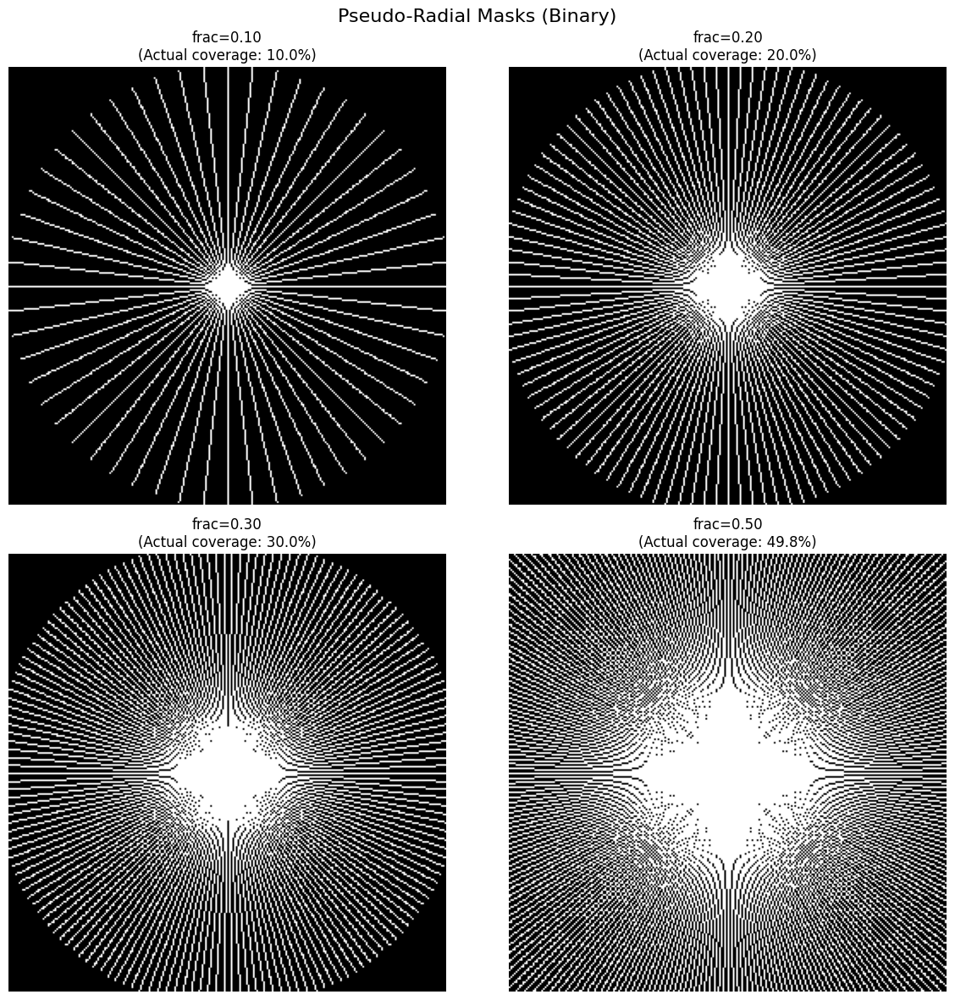

In [27]:
shape = (256, 256)
fracs = [0.1, 0.2, 0.3, 0.5]

fig, axes = plt.subplots(2, 2, figsize=(12, 12))

for idx, frac in enumerate(fracs):
    row, col = divmod(idx, 2)
    mask = pseudo_radial_mask(shape, frac=frac)
    actual_frac = np.sum(mask) / (256*256)
    
    axes[row, col].imshow(mask, cmap='gray', vmin=0, vmax=1)
    axes[row, col].set_title(f'frac={frac:.2f}\n(Actual coverage: {actual_frac:.1%})')
    axes[row, col].axis('off')

plt.suptitle('Pseudo-Radial Masks (Binary)', fontsize=16)
plt.tight_layout()
plt.show()

## Proof of unitary fft

In [58]:
# Test with a sample knee image image
h5_path = "C:/Users/Sepi/Desktop/Sepehr/UNIVERSITY/Uni Master aut/Term 1/Medical Imaging/project/fastMRI-data/knee_singlecoil_val/20 samples/file1000000.h5"

img, k = load_rss_image_kspace_256(h5_path) # load a knee image and resize it to 256 * 256

# Property 1: Energy preservation (Parseval's theorem)
# ||x||^2 = ||F(x)||^2 for unitary transforms
energy_img = np.linalg.norm(img)**2
energy_k = np.linalg.norm(k)**2

print("=" * 60)
print("Property 1: Energy Preservation")
print("=" * 60)
print(f"Energy in image domain:    {energy_img:.6f}")
print(f"Energy in k-space domain:  {energy_k:.6f}")
print(f"Relative difference:       {abs(energy_img - energy_k) / energy_img:.2e}")
print(f"Are they equal? {np.allclose(energy_img, energy_k)}")
print()

# Property 2: Perfect reconstruction
# F^(-1)(F(x)) = x
img_reconstructed = ifft2c(k)
reconstruction_error = np.linalg.norm(img - img_reconstructed) / np.linalg.norm(img)

print("=" * 60)
print("Property 2: Perfect Reconstruction")
print("=" * 60)
print(f"Original image norm:       {np.linalg.norm(img):.6f}")
print(f"Reconstructed image norm:  {np.linalg.norm(img_reconstructed):.6f}")
print(f"Relative reconstruction error: {reconstruction_error:.2e}")
print(f"Perfect reconstruction? {np.allclose(img, img_reconstructed)}")
print()

# Property 3: Inner product preservation
# <x, y> = <F(x), F(y)> for unitary transforms
N = 256
img2 = np.random.randn(N, N) + 1j * np.random.randn(N, N)
k2 = fft2c(img2)

inner_product_img = np.vdot(img.ravel(), img2.ravel())  # <x, y>
inner_product_k = np.vdot(k.ravel(), k2.ravel())        # <F(x), F(y)>

print("=" * 60)
print("Property 3: Inner Product Preservation")
print("=" * 60)
print(f"Inner product in image:    {inner_product_img}")
print(f"Inner product in k-space:  {inner_product_k}")
print(f"Relative difference:       {abs(inner_product_img - inner_product_k) / abs(inner_product_img):.2e}")
print(f"Are they equal? {np.allclose(inner_product_img, inner_product_k)}")
print()

# Property 4: Orthonormality (F^H F = I)
# This is shown by properties 1-3, but we can verify with equation (15) from paper
s = img
z = img2
alpha = fft2c(s)
beta = fft2c(z)

norm_diff_image = np.linalg.norm(s - z)**2
norm_diff_kspace = np.linalg.norm(alpha - beta)**2

print("=" * 60)
print("Property 4: Equation (15) from Paper")
print("=" * 60)
print(f"||s - z||^2 (image):       {norm_diff_image:.6f}")
print(f"||α - β||^2 (k-space):     {norm_diff_kspace:.6f}")
print(f"Relative difference:       {abs(norm_diff_image - norm_diff_kspace) / norm_diff_image:.2e}")
print(f"Are they equal? {np.allclose(norm_diff_image, norm_diff_kspace)}")
print()

print("=" * 60)
print("CONCLUSION: FFT is UNITARY ✓")
print("=" * 60)

Property 1: Energy Preservation
Energy in image domain:    0.000040
Energy in k-space domain:  0.000040
Relative difference:       0.00e+00
Are they equal? True

Property 2: Perfect Reconstruction
Original image norm:       0.006327
Reconstructed image norm:  0.006327
Relative reconstruction error: 2.77e-16
Perfect reconstruction? True

Property 3: Inner Product Preservation
Inner product in image:    (0.002635636771996769-0.011868248364017425j)
Inner product in k-space:  (0.0026356367719967745-0.011868248364017422j)
Relative difference:       5.45e-16
Are they equal? True

Property 4: Equation (15) from Paper
||s - z||^2 (image):       131397.461859
||α - β||^2 (k-space):     131397.461859
Relative difference:       2.21e-16
Are they equal? True

CONCLUSION: FFT is UNITARY ✓


## proof of unitary wavelet

In [59]:
# Test with a sample knee image image
h5_path = "C:/Users/Sepi/Desktop/Sepehr/UNIVERSITY/Uni Master aut/Term 1/Medical Imaging/project/fastMRI-data/knee_singlecoil_val/20 samples/file1000000.h5"

img, k = load_rss_image_kspace_256(h5_path) # load a knee image and resize it to 256 * 256

wavelet = 'haar'  # or 'haar', 'coif1', etc.
level = 4

# Property 1: Energy preservation
# ||x||^2 = ||W(x)||^2 for unitary transforms
alpha, slices = wavelet_forward(img, wavelet=wavelet, level=level)
energy_img = np.linalg.norm(img)**2
energy_wavelet = np.linalg.norm(alpha)**2

print("=" * 60)
print("Property 1: Energy Preservation")
print("=" * 60)
print(f"Wavelet: {wavelet}, Level: {level}")
print(f"Energy in image domain:      {energy_img:.6f}")
print(f"Energy in wavelet domain:    {energy_wavelet:.6f}")
print(f"Relative difference:         {abs(energy_img - energy_wavelet) / energy_img:.2e}")
print(f"Are they equal? {np.allclose(energy_img, energy_wavelet)}")
print()

# Property 2: Perfect reconstruction
# W^(-1)(W(x)) = x
img_reconstructed = wavelet_inverse(alpha, slices, wavelet=wavelet)
reconstruction_error = np.linalg.norm(img - img_reconstructed) / np.linalg.norm(img)

print("=" * 60)
print("Property 2: Perfect Reconstruction")
print("=" * 60)
print(f"Original image norm:         {np.linalg.norm(img):.6f}")
print(f"Reconstructed image norm:    {np.linalg.norm(img_reconstructed):.6f}")
print(f"Relative reconstruction error: {reconstruction_error:.2e}")
print(f"Perfect reconstruction? {np.allclose(img, img_reconstructed)}")
print()

# Property 3: Inner product preservation
# <x, y> = <W(x), W(y)> for unitary transforms
img2 = np.random.randn(N, N)
alpha2, slices2 = wavelet_forward(img2, wavelet=wavelet, level=level)

inner_product_img = np.vdot(img.ravel(), img2.ravel())
inner_product_wavelet = np.vdot(alpha.ravel(), alpha2.ravel())

print("=" * 60)
print("Property 3: Inner Product Preservation")
print("=" * 60)
print(f"Inner product in image:      {inner_product_img:.6f}")
print(f"Inner product in wavelet:    {inner_product_wavelet:.6f}")
print(f"Relative difference:         {abs(inner_product_img - inner_product_wavelet) / abs(inner_product_img):.2e}")
print(f"Are they equal? {np.allclose(inner_product_img, inner_product_wavelet)}")
print()

# Property 4: Equation (15) from paper
# ||s - z||^2 = ||α - β||^2 where α = Ψ^(-1)s, β = Ψ^(-1)z
s = img
z = img2
alpha_s, slices_s = wavelet_forward(s, wavelet=wavelet, level=level)
beta_z, slices_z = wavelet_forward(z, wavelet=wavelet, level=level)

norm_diff_image = np.linalg.norm(s - z)**2
norm_diff_wavelet = np.linalg.norm(alpha_s - beta_z)**2

print("=" * 60)
print("Property 4: Equation (15) from Paper")
print("=" * 60)
print(f"||s - z||^2 (image):         {norm_diff_image:.6f}")
print(f"||α - β||^2 (wavelet):       {norm_diff_wavelet:.6f}")
print(f"Relative difference:         {abs(norm_diff_image - norm_diff_wavelet) / norm_diff_image:.2e}")
print(f"Are they equal? {np.allclose(norm_diff_image, norm_diff_wavelet)}")
print()

# Property 5: Orthonormality test with different wavelets
print("=" * 60)
print("Testing Different Wavelets")
print("=" * 60)
wavelets_to_test = ['haar', 'db2', 'db4', 'sym4', 'coif1']
for wv in wavelets_to_test:
    try:
        a, sl = wavelet_forward(img, wavelet=wv, level=level)
        e_img = np.linalg.norm(img)**2
        e_wav = np.linalg.norm(a)**2
        is_unitary = np.allclose(e_img, e_wav)
        print(f"{wv:8s}: Energy preserved? {is_unitary}  "
              f"(rel_err: {abs(e_img - e_wav) / e_img:.2e})")
    except:
        print(f"{wv:8s}: Not available")
print()

print("=" * 60)
print("CONCLUSION: The Wavelet Transform is UNITARY ✓")
print("=" * 60)


Property 1: Energy Preservation
Wavelet: haar, Level: 4
Energy in image domain:      0.000040
Energy in wavelet domain:    0.000040
Relative difference:         1.02e-15
Are they equal? True

Property 2: Perfect Reconstruction
Original image norm:         0.006327
Reconstructed image norm:    0.006327
Relative reconstruction error: 1.09e-15
Perfect reconstruction? True

Property 3: Inner Product Preservation
Inner product in image:      -0.003254
Inner product in wavelet:    -0.003254
Relative difference:         3.07e-15
Are they equal? True

Property 4: Equation (15) from Paper
||s - z||^2 (image):         65539.013322
||α - β||^2 (wavelet):       65539.013322
Relative difference:         4.44e-16
Are they equal? True

Testing Different Wavelets
haar    : Energy preserved? True  (rel_err: 1.02e-15)
db2     : Energy preserved? True  (rel_err: 1.69e-16)
db4     : Energy preserved? True  (rel_err: 1.69e-16)
sym4    : Energy preserved? True  (rel_err: 1.69e-13)
coif1   : Energy preserved

## Explore a h5 data

In [30]:
file_path = "C:/Users/Sepi/Desktop/Sepehr/UNIVERSITY/Uni Master aut/Term 1/Medical Imaging/project/fastMRI-data/knee_singlecoil_val/20 samples/file1000000.h5"

singlecoil = h5py.File(file_path)
print('Keys:', list(singlecoil.keys()))

Keys: ['ismrmrd_header', 'kspace', 'reconstruction_esc', 'reconstruction_rss']


(640, 368)


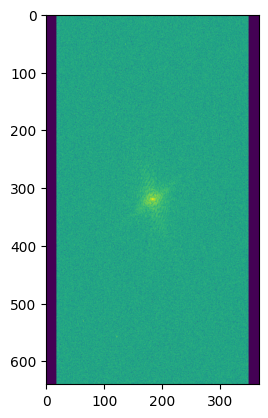

In [31]:
singlecoil_reconstruction_rss = singlecoil["reconstruction_rss"][:]
singlecoil_kspace = singlecoil["kspace"][:]
slice_id = 8
singlecoil_kspace_slice = singlecoil_kspace[slice_id]
print(singlecoil_kspace_slice.shape)

plt.imshow(np.log(np.abs(singlecoil_kspace_slice) + 1e-9))
plt.show()

In [32]:
singlecoil_kspace.shape

(35, 640, 368)

(320, 320)


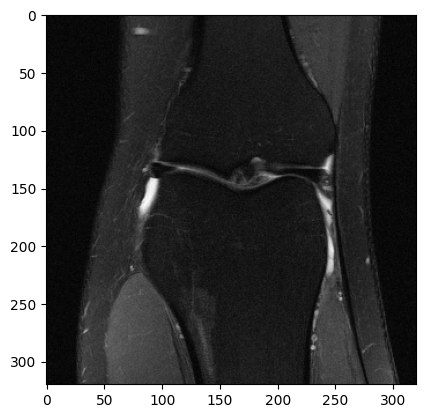

In [33]:
singlecoil_reconstruction_slice = singlecoil_reconstruction_rss[17]
print(singlecoil_reconstruction_slice.shape)

plt.imshow(singlecoil_reconstruction_slice, cmap="gray")
plt.show()

We can also use fastMRI library functions

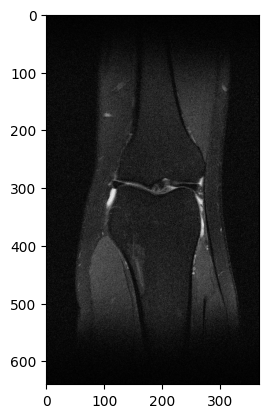

In [34]:
import fastmri
from fastmri.data import transforms as T
import cv2
slice_id = 17
singlecoil_kspace_tensor = T.to_tensor(singlecoil_kspace)
singlecoil_kspace_tensor.shape

singlecoil_sampled_image = fastmri.ifft2c(singlecoil_kspace_tensor)
singlecoil_sampled_image.shape

singlecoil_sampled_image_abs = fastmri.complex_abs(singlecoil_sampled_image)
singlecoil_sampled_image_abs.shape

image_resized = cv2.resize(singlecoil_sampled_image_abs[slice_id].numpy(), (256, 256))


# plt.imshow(singlecoil_sampled_image_abs[slice_id].numpy(), cmap="gray") # ?
plt.imshow(singlecoil_sampled_image_abs[slice_id], cmap="gray") # ?

plt.show()



## Load brain data

shape of kspace: (16, 16, 768, 396)
shape of combined colils data: (16, 384, 384)


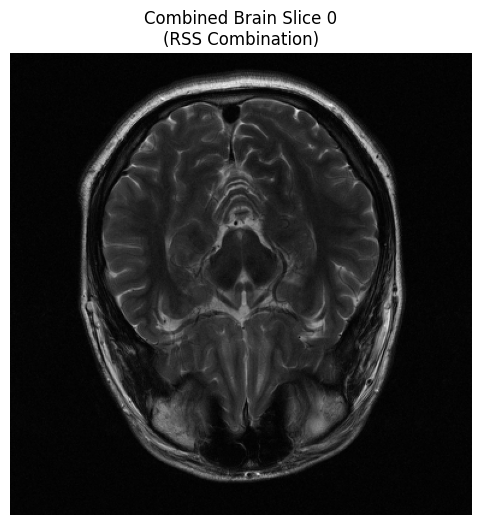

In [184]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import fastmri
from fastmri.data import transforms as T

# -------------------------------------------------------------
# Replace with your actual file path
file_path = "C:/Users/Sepi/Desktop/Sepehr/UNIVERSITY/Uni Master aut/Term 1/Medical Imaging/project/fastMRI-data/brain train/multicoil_train/T2/file_brain_AXT2_200_2000229.h5"
# -------------------------------------------------------------

with h5py.File(file_path, 'r') as hf:
    # 1. Load k-space
    # Shape: (Slices, Coils, Height, Width) -> e.g., (16, 20, 640, 320)
    kspace = hf['kspace'][()] 
    
    volume_combined = hf['reconstruction_rss'][()]

# Pick the first
slice_idx = 0
image_slice = volume_combined[slice_idx]

print ('shape of kspace:', kspace.shape)

print ('shape of combined colils data:', volume_combined.shape)

plt.figure(figsize=(6, 6))
plt.imshow(image_slice, cmap='gray')
plt.title(f"Combined Brain Slice {slice_idx}\n(RSS Combination)")
plt.axis('off')
plt.show()



# Execution

## quick results with methods comparisons

In [61]:
n_sub = 18
####### knee
paths = sorted(glob.glob('C:/Users/Sepi/Desktop/Sepehr/UNIVERSITY/Uni Master aut/Term 1/Medical Imaging/project/fastMRI-data/knee_singlecoil_val/20 samples/*.h5'))[n_sub-1:n_sub]
slice_idx = 'middle'
####### brain
#paths = sorted(glob.glob('C:/Users/Sepi/Desktop/Sepehr/UNIVERSITY/Uni Master aut/Term 1/Medical Imaging/project/fastMRI-data/brain train/multicoil_train/T1/*.h5'))[0:n_sub]
#slice_idx = 0

sampling_rate = 0.2
results_isrsl0 = []
results_sl0 = []
results_zerofilled = []
     
Mask_type = 'pseudo_radial'    # pseudo_radial, spiral, random, cartesian_kx, cartesian_ky, square, vd_random
Denoiser = 'wiener'     # BM3D, wiener
sigma_k = list(np.linspace(5, 0.3, 30))

for subj_idx, path in enumerate(paths):
    img_ref, k_full = load_rss_image_kspace_256(path, slice_index=slice_idx)  
    
    # ISRSL0 reconstruction
    img_isrsl0, mask = ISRL0_reconstruct(
        k_full,
        sampling_rate=sampling_rate,
        sigma_list=sigma_k,
        lam_p=0.077,
        mu=0.1,
        L=2,
        seed=0,
        denoiser_method=Denoiser,
        mask_type=Mask_type
    )
    
    # Standard SL0 reconstruction (using same mask)
    img_sl0 = SL0_reconstruct(
        k_full, 
        mask,
        sigma_min=0.15,      # Match ISRSL0's final sigma
        sigma_max=1.5,       # Match ISRSL0's initial sigma
        sigma_decrease_factor=0.5,
        mu_0=0.1,            # Match ISRSL0's mu
        L=2                  # Match ISRSL0's L
    )
    
    # Zero-filled reconstruction
    k_masked = k_full * mask
    img_zerofilled = np.abs(ifft2c(k_masked))
    
    # Evaluate all three methods
    psnr_isr, hfen_isr, ssim_isr = evaluate_reconstruction(img_ref, img_isrsl0)
    psnr_sl0, hfen_sl0, ssim_sl0 = evaluate_reconstruction(img_ref, img_sl0)
    psnr_zf, hfen_zf, ssim_zf = evaluate_reconstruction(img_ref, img_zerofilled)
    
    results_isrsl0.append((psnr_isr, hfen_isr, ssim_isr))
    results_sl0.append((psnr_sl0, hfen_sl0, ssim_sl0))
    results_zerofilled.append((psnr_zf, hfen_zf, ssim_zf))
    
    print(f"Subject {subj_idx:02d}:")
    print(f"  Zero-filled: PSNR={psnr_zf:.2f} dB, HFEN={hfen_zf:.3f}, SSIM={ssim_zf:.3f}")
    print(f"  SL0:         PSNR={psnr_sl0:.2f} dB, HFEN={hfen_sl0:.3f}, SSIM={ssim_sl0:.3f}")
    print(f"  ISRSL0:      PSNR={psnr_isr:.2f} dB, HFEN={hfen_isr:.3f}, SSIM={ssim_isr:.3f}")
    print(f"  ISRSL0 vs SL0: ΔPSNR={psnr_isr-psnr_sl0:.2f} dB, ΔSSIM={ssim_isr-ssim_sl0:.3f}\n")

# Convert to arrays
results_isrsl0 = np.array(results_isrsl0)
results_sl0 = np.array(results_sl0)
results_zerofilled = np.array(results_zerofilled)

# Statistics
means_isr = results_isrsl0.mean(axis=0)
means_sl0 = results_sl0.mean(axis=0)
means_zf = results_zerofilled.mean(axis=0)

stds_isr = results_isrsl0.std(axis=0)
stds_sl0 = results_sl0.std(axis=0)
stds_zf = results_zerofilled.std(axis=0)

print(f"\n{'='*70}")
print(f"Averaged over {n_sub} subjects (mean ± std):")
print(f"{'='*70}")

print("\nZero-filled:")
print(f"  PSNR = {means_zf[0]:.2f} ± {stds_zf[0]:.2f} dB")
print(f"  HFEN = {means_zf[1]:.3f} ± {stds_zf[1]:.3f}")
print(f"  SSIM = {means_zf[2]:.3f} ± {stds_zf[2]:.3f}")

print("\nSL0 (standard):")
print(f"  PSNR = {means_sl0[0]:.2f} ± {stds_sl0[0]:.2f} dB")
print(f"  HFEN = {means_sl0[1]:.3f} ± {stds_sl0[1]:.3f}")
print(f"  SSIM = {means_sl0[2]:.3f} ± {stds_sl0[2]:.3f}")

print("\nISRSL0 (with regularization):")
print(f"  PSNR = {means_isr[0]:.2f} ± {stds_isr[0]:.2f} dB")
print(f"  HFEN = {means_isr[1]:.3f} ± {stds_isr[1]:.3f}")
print(f"  SSIM = {means_isr[2]:.3f} ± {stds_isr[2]:.3f}")

print("\nISRSL0 improvement over SL0:")
print(f"  ΔPSNR = {means_isr[0]-means_sl0[0]:.2f} dB")
print(f"  ΔHFEN = {means_sl0[1]-means_isr[1]:.3f} (lower is better)")
print(f"  ΔSSIM = {means_isr[2]-means_sl0[2]:.3f}")

# Save comprehensive comparison
with open('sl0_vs_isrsl0_comparison.csv', 'w', newline='') as f:
    w = csv.writer(f)
    w.writerow(['subject', 'Method', 'PSNR', 'HFEN', 'SSIM'])
    for i in range(len(results_isrsl0)):
        w.writerow([i, 'Zero-filled', *results_zerofilled[i]])
        w.writerow([i, 'SL0', *results_sl0[i]])
        w.writerow([i, 'ISRSL0', *results_isrsl0[i]])


Subject 00:
  Zero-filled: PSNR=30.19 dB, HFEN=0.249, SSIM=0.770
  SL0:         PSNR=30.31 dB, HFEN=0.249, SSIM=0.770
  ISRSL0:      PSNR=32.69 dB, HFEN=0.248, SSIM=0.850
  ISRSL0 vs SL0: ΔPSNR=2.38 dB, ΔSSIM=0.079


Averaged over 18 subjects (mean ± std):

Zero-filled:
  PSNR = 30.19 ± 0.00 dB
  HFEN = 0.249 ± 0.000
  SSIM = 0.770 ± 0.000

SL0 (standard):
  PSNR = 30.31 ± 0.00 dB
  HFEN = 0.249 ± 0.000
  SSIM = 0.770 ± 0.000

ISRSL0 (with regularization):
  PSNR = 32.69 ± 0.00 dB
  HFEN = 0.248 ± 0.000
  SSIM = 0.850 ± 0.000

ISRSL0 improvement over SL0:
  ΔPSNR = 2.38 dB
  ΔHFEN = 0.001 (lower is better)
  ΔSSIM = 0.079


## Complete Run and visualize a sample reconstruction (BM3D + Wiener)

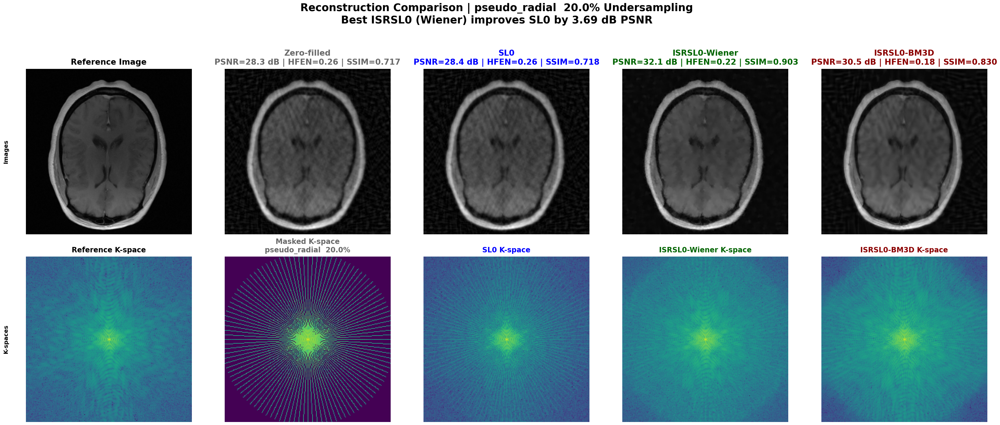

In [62]:
n_sub = 1
####### knee
paths = sorted(glob.glob('C:/Users/Sepi/Desktop/Sepehr/UNIVERSITY/Uni Master aut/Term 1/Medical Imaging/project/fastMRI-data/knee_singlecoil_val/20 samples/*.h5'))[n_sub-1:n_sub]
slice_idx = 'middle'

####### brain
paths = sorted(glob.glob('C:/Users/Sepi/Desktop/Sepehr/UNIVERSITY/Uni Master aut/Term 1/Medical Imaging/project/fastMRI-data/brain train/multicoil_train/T1_post/*.h5'))[n_sub-1:n_sub]
slice_idx = 0


sampling_rate = 0.2
sigma_k = list(np.linspace(5, 0.3, 30))
lam_p = 0.077
mu = 0.1
L = 2
Mask_type = 'pseudo_radial' # pseudo_radial, spiral, random, cartesian_kx, cartesian_ky, square, vd_random

# Results dicts
results_wiener = {'isrsl0': [], 'sl0': [], 'zerofilled': []}
results_bm3d   = {'isrsl0': [], 'sl0': [], 'zerofilled': []}

for subj_idx, path in enumerate(paths):
    path = path

img_ref, k_full = load_rss_image_kspace_256(path, slice_index=slice_idx)

# ========== WIENER DENOISER ==========
img_isr_wiener, mask = ISRL0_reconstruct(
    k_full, sampling_rate=sampling_rate, sigma_list=sigma_k,
    lam_p=lam_p, mu=mu, L=L, seed=0,
    denoiser_method='wiener', mask_type=Mask_type
)
img_sl0 = SL0_reconstruct(
    k_full, mask, sigma_min=0.3, sigma_max=5.0,
    sigma_decrease_factor=0.1, mu_0=mu, L=L
)
k_masked = k_full * mask
img_zf   = np.abs(ifft2c(k_masked))

psnr_wiener_isr, hfen_wiener_isr, ssim_wiener_isr = evaluate_reconstruction(img_ref, img_isr_wiener)
psnr_sl0,        hfen_sl0,        ssim_sl0        = evaluate_reconstruction(img_ref, img_sl0)
psnr_zf,         hfen_zf,         ssim_zf         = evaluate_reconstruction(img_ref, img_zf)

results_wiener['isrsl0'].append((psnr_wiener_isr, hfen_wiener_isr, ssim_wiener_isr))
results_wiener['sl0'].append((psnr_sl0, hfen_sl0, ssim_sl0))
results_wiener['zerofilled'].append((psnr_zf, hfen_zf, ssim_zf))

# ========== BM3D DENOISER ==========
img_isr_bm3d, _ = ISRL0_reconstruct(
    k_full, sampling_rate=sampling_rate, sigma_list=sigma_k,
    lam_p=lam_p, mu=mu, L=L, seed=0,
    denoiser_method='BM3D', mask_type=Mask_type
)

psnr_bm3d_isr, hfen_bm3d_isr, ssim_bm3d_isr = evaluate_reconstruction(img_ref, img_isr_bm3d)
results_bm3d['isrsl0'].append((psnr_bm3d_isr, hfen_bm3d_isr, ssim_bm3d_isr))
results_bm3d['sl0'].append((psnr_sl0, hfen_sl0, ssim_sl0))
results_bm3d['zerofilled'].append((psnr_zf, hfen_zf, ssim_zf))

# ── Save for plotting (overwrites each iteration, keeps last subject) ──
img_isrsl0_wiener = img_isr_wiener
img_isrsl0_bm3d   = img_isr_bm3d
img_sl0_plot      = img_sl0
mask_plot         = mask

# ══════════════════════════════════════════════════════════════════════════════
def plot_image_kspace_comparison(img_ref, img_sl0, img_isrsl0_wiener, img_isrsl0_bm3d,
                                  mask, sampling_rate, Mask_type,
                                  figsize=(34, 14)):
    """
    Plot reference, zero-filled, SL0, ISRSL0-Wiener, and ISRSL0-BM3D
    reconstructions with their k-spaces.
    """
    n_cols = 5
    fig, axes = plt.subplots(2, n_cols, figsize=figsize)
    fig.patch.set_facecolor('white')

    # ── K-spaces ──────────────────────────────────────────────────────────────
    k_ref           = fft2c(img_ref)
    k_masked        = k_ref * mask
    k_sl0           = fft2c(img_sl0)
    k_isrsl0_wiener = fft2c(img_isrsl0_wiener)
    k_isrsl0_bm3d   = fft2c(img_isrsl0_bm3d)

    # ── Zero-filled image ─────────────────────────────────────────────────────
    img_zerofilled = np.abs(ifft2c(k_masked))

    # ── Metrics ───────────────────────────────────────────────────────────────
    psnr_zf,  hfen_zf,  ssim_zf  = evaluate_reconstruction(img_ref, img_zerofilled)
    psnr_sl0, hfen_sl0, ssim_sl0 = evaluate_reconstruction(img_ref, img_sl0)
    psnr_wn,  hfen_wn,  ssim_wn  = evaluate_reconstruction(img_ref, img_isrsl0_wiener)
    psnr_bm,  hfen_bm,  ssim_bm  = evaluate_reconstruction(img_ref, img_isrsl0_bm3d)

    # ── Helpers ───────────────────────────────────────────────────────────────
    def show_img(ax, data, title, color='black'):
        im = ax.imshow(np.abs(data), cmap='gray')
        ax.set_title(title, fontweight='bold', color=color,
                     fontsize=19, pad=10)
        ax.axis('off')
        # cb = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        # cb.ax.tick_params(labelsize=12)

    def show_ksp(ax, kdata, title, color='black'):
        k = ax.imshow(np.log(np.abs(kdata) + 1e-10), cmap='viridis')
        ax.set_title(title, color=color, fontweight='bold',
                     fontsize=17, pad=10)
        ax.axis('off')
        # cb = plt.colorbar(k, ax=ax, fraction=0.046, pad=0.04)
        # cb.ax.tick_params(labelsize=12)

    # ── Row labels on the left ────────────────────────────────────────────────
    axes[0, 0].annotate('Images', xy=(-0.12, 0.5),
                        xycoords='axes fraction', fontsize=14,
                        fontweight='bold', rotation=90,
                        ha='center', va='center')
    axes[1, 0].annotate('K-spaces', xy=(-0.12, 0.5),
                        xycoords='axes fraction', fontsize=14,
                        fontweight='bold', rotation=90,
                        ha='center', va='center')

    # ══════════════════════════════════════════════════════════════════════════
    # TOP ROW — Images
    # ══════════════════════════════════════════════════════════════════════════
    show_img(axes[0, 0], img_ref,
             'Reference Image')
    show_img(axes[0, 1], img_zerofilled,
             f'Zero-filled\nPSNR={psnr_zf:.1f} dB | HFEN={hfen_zf:.2f} | SSIM={ssim_zf:.3f}',
             color='dimgray')
    show_img(axes[0, 2], img_sl0,
             f'SL0\nPSNR={psnr_sl0:.1f} dB | HFEN={hfen_sl0:.2f} | SSIM={ssim_sl0:.3f}',
             color='blue')
    show_img(axes[0, 3], img_isrsl0_wiener,
             f'ISRSL0-Wiener\nPSNR={psnr_wn:.1f} dB | HFEN={hfen_wn:.2f} | SSIM={ssim_wn:.3f}',
             color='darkgreen')
    show_img(axes[0, 4], img_isrsl0_bm3d,
             f'ISRSL0-BM3D\nPSNR={psnr_bm:.1f} dB | HFEN={hfen_bm:.2f} | SSIM={ssim_bm:.3f}',
             color='darkred')

    # ══════════════════════════════════════════════════════════════════════════
    # BOTTOM ROW — K-spaces
    # ══════════════════════════════════════════════════════════════════════════
    show_ksp(axes[1, 0], k_ref,           'Reference K-space')
    show_ksp(axes[1, 1], k_masked,
             f'Masked K-space\n{Mask_type}  {100*sampling_rate:.1f}%',
             color='dimgray')
    show_ksp(axes[1, 2], k_sl0,           'SL0 K-space',           color='blue')
    show_ksp(axes[1, 3], k_isrsl0_wiener, 'ISRSL0-Wiener K-space', color='darkgreen')
    show_ksp(axes[1, 4], k_isrsl0_bm3d,   'ISRSL0-BM3D K-space',   color='darkred')

    # ── Super-title ───────────────────────────────────────────────────────────
    best_psnr  = max(psnr_wn, psnr_bm)
    best_label = 'Wiener' if psnr_wn >= psnr_bm else 'BM3D'
    plt.suptitle(
        f'Reconstruction Comparison | {Mask_type}  {100*sampling_rate:.1f}% Undersampling\n'
        f'Best ISRSL0 ({best_label}) improves SL0 by {best_psnr - psnr_sl0:.2f} dB PSNR',
        fontsize=25, fontweight='bold', y=1.02
    )

    plt.tight_layout(pad=2.5, h_pad=3.5, w_pad=2.5)
    plt.show()


# ── Call with corrected variable names ────────────────────────────────────────
plot_image_kspace_comparison(
    img_ref,
    img_sl0_plot,         
    img_isrsl0_wiener,    
    img_isrsl0_bm3d,      
    mask_plot,            
    sampling_rate,
    Mask_type
)


## Fast Run and visualize a sample reconstruction (Wiener Only)

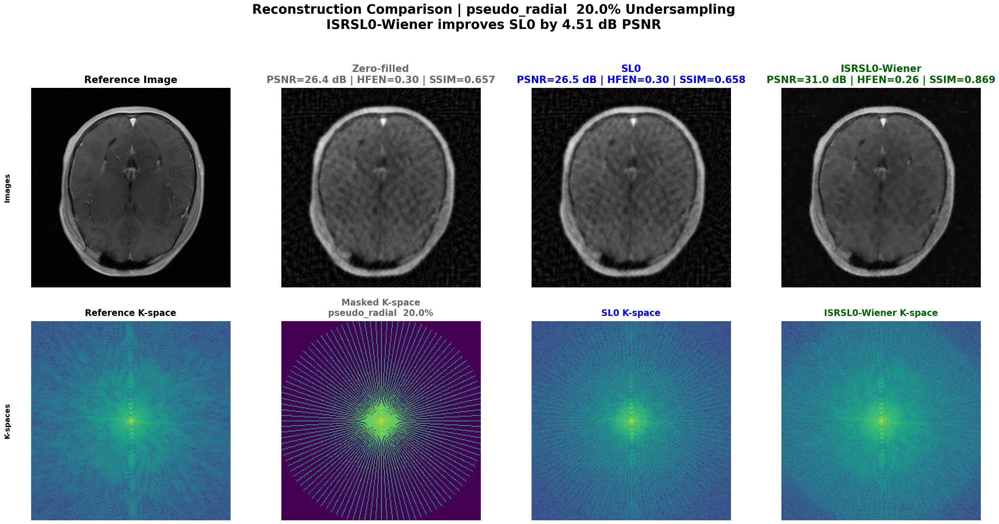

In [65]:
n_sub = 1
####### knee
paths = sorted(glob.glob('C:/Users/Sepi/Desktop/Sepehr/UNIVERSITY/Uni Master aut/Term 1/Medical Imaging/project/fastMRI-data/knee_singlecoil_val/20 samples/*.h5'))[n_sub-1:n_sub]
slice_idx = 'middle'

n_sub = 2
####### brain
paths = sorted(glob.glob('C:/Users/Sepi/Desktop/Sepehr/UNIVERSITY/Uni Master aut/Term 1/Medical Imaging/project/fastMRI-data/brain train/multicoil_train/T1_post/*.h5'))[n_sub-1:n_sub]
slice_idx = 0

sampling_rate = 0.2
sigma_k = list(np.linspace(5, 0.3, 30))
lam_p = 0.077
mu = 0.1
L = 2
Mask_type = 'pseudo_radial' # pseudo_radial, spiral, random, cartesian_kx, cartesian_ky, square, vd_random

# Results dict
results_wiener = {'isrsl0': [], 'sl0': [], 'zerofilled': []}

for subj_idx, path in enumerate(paths):

    img_ref, k_full = load_rss_image_kspace_256(path, slice_index=slice_idx)

    # ========== WIENER DENOISER ==========
    img_isr_wiener, mask = ISRL0_reconstruct(
        k_full, sampling_rate=sampling_rate, sigma_list=sigma_k,
        lam_p=lam_p, mu=mu, L=L, seed=0,
        denoiser_method='wiener', mask_type=Mask_type
    )
    img_sl0 = SL0_reconstruct(
        k_full, mask, sigma_min=0.3, sigma_max=5.0,
        sigma_decrease_factor=0.1, mu_0=mu, L=L
    )
    k_masked = k_full * mask
    img_zf   = np.abs(ifft2c(k_masked))

    psnr_wiener_isr, hfen_wiener_isr, ssim_wiener_isr = evaluate_reconstruction(img_ref, img_isr_wiener)
    psnr_sl0,        hfen_sl0,        ssim_sl0        = evaluate_reconstruction(img_ref, img_sl0)
    psnr_zf,         hfen_zf,         ssim_zf         = evaluate_reconstruction(img_ref, img_zf)

    results_wiener['isrsl0'].append((psnr_wiener_isr, hfen_wiener_isr, ssim_wiener_isr))
    results_wiener['sl0'].append((psnr_sl0, hfen_sl0, ssim_sl0))
    results_wiener['zerofilled'].append((psnr_zf, hfen_zf, ssim_zf))

    # ── Save for plotting ──────────────────────────────────────────────────────
    img_isrsl0_wiener = img_isr_wiener
    img_sl0_plot      = img_sl0
    mask_plot         = mask

# ══════════════════════════════════════════════════════════════════════════════
def plot_image_kspace_comparison(img_ref, img_sl0, img_isrsl0_wiener,
                                  mask, sampling_rate, Mask_type,
                                  figsize=(28, 14)):
    """
    Plot reference, zero-filled, SL0, and ISRSL0-Wiener
    reconstructions with their k-spaces.
    """
    n_cols = 4   # ref | zero-filled | SL0 | ISRSL0-Wiener
    fig, axes = plt.subplots(2, n_cols, figsize=figsize)
    fig.patch.set_facecolor('white')

    # ── K-spaces ──────────────────────────────────────────────────────────────
    k_ref           = fft2c(img_ref)
    k_masked        = k_ref * mask
    k_sl0           = fft2c(img_sl0)
    k_isrsl0_wiener = fft2c(img_isrsl0_wiener)

    # ── Zero-filled image ─────────────────────────────────────────────────────
    img_zerofilled = np.abs(ifft2c(k_masked))

    # ── Metrics ───────────────────────────────────────────────────────────────
    psnr_zf,  hfen_zf,  ssim_zf  = evaluate_reconstruction(img_ref, img_zerofilled)
    psnr_sl0, hfen_sl0, ssim_sl0 = evaluate_reconstruction(img_ref, img_sl0)
    psnr_wn,  hfen_wn,  ssim_wn  = evaluate_reconstruction(img_ref, img_isrsl0_wiener)

    # ── Helpers ───────────────────────────────────────────────────────────────
    def show_img(ax, data, title, color='black'):
        im = ax.imshow(np.abs(data), cmap='gray')
        ax.set_title(title, fontweight='bold', color=color,
                     fontsize=19, pad=10)
        ax.axis('off')

    def show_ksp(ax, kdata, title, color='black'):
        ax.imshow(np.log(np.abs(kdata) + 1e-10), cmap='viridis')
        ax.set_title(title, color=color, fontweight='bold',
                     fontsize=17, pad=10)
        ax.axis('off')

    # ── Row labels on the left ────────────────────────────────────────────────
    axes[0, 0].annotate('Images', xy=(-0.12, 0.5),
                        xycoords='axes fraction', fontsize=14,
                        fontweight='bold', rotation=90,
                        ha='center', va='center')
    axes[1, 0].annotate('K-spaces', xy=(-0.12, 0.5),
                        xycoords='axes fraction', fontsize=14,
                        fontweight='bold', rotation=90,
                        ha='center', va='center')

    # ══════════════════════════════════════════════════════════════════════════
    # TOP ROW — Images
    # ══════════════════════════════════════════════════════════════════════════
    show_img(axes[0, 0], img_ref,
             'Reference Image')
    show_img(axes[0, 1], img_zerofilled,
             f'Zero-filled\nPSNR={psnr_zf:.1f} dB | HFEN={hfen_zf:.2f} | SSIM={ssim_zf:.3f}',
             color='dimgray')
    show_img(axes[0, 2], img_sl0,
             f'SL0\nPSNR={psnr_sl0:.1f} dB | HFEN={hfen_sl0:.2f} | SSIM={ssim_sl0:.3f}',
             color='blue')
    show_img(axes[0, 3], img_isrsl0_wiener,
             f'ISRSL0-Wiener\nPSNR={psnr_wn:.1f} dB | HFEN={hfen_wn:.2f} | SSIM={ssim_wn:.3f}',
             color='darkgreen')

    # ══════════════════════════════════════════════════════════════════════════
    # BOTTOM ROW — K-spaces
    # ══════════════════════════════════════════════════════════════════════════
    show_ksp(axes[1, 0], k_ref,           'Reference K-space')
    show_ksp(axes[1, 1], k_masked,
             f'Masked K-space\n{Mask_type}  {100*sampling_rate:.1f}%',
             color='dimgray')
    show_ksp(axes[1, 2], k_sl0,           'SL0 K-space',           color='blue')
    show_ksp(axes[1, 3], k_isrsl0_wiener, 'ISRSL0-Wiener K-space', color='darkgreen')

    # ── Super-title ───────────────────────────────────────────────────────────
    plt.suptitle(
        f'Reconstruction Comparison | {Mask_type}  {100*sampling_rate:.1f}% Undersampling\n'
        f'ISRSL0-Wiener improves SL0 by {psnr_wn - psnr_sl0:.2f} dB PSNR',
        fontsize=25, fontweight='bold', y=1.02
    )

    plt.tight_layout(pad=2.5, h_pad=3.5, w_pad=2.5)
    plt.show()


# ── Call ──────────────────────────────────────────────────────────────────────
plot_image_kspace_comparison(
    img_ref,
    img_sl0_plot,
    img_isrsl0_wiener,
    mask_plot,
    sampling_rate,
    Mask_type
)


## through run and save csv outputs

In [23]:
n_sub = 199
paths = sorted(glob.glob('C:/Users/Sepi/Desktop/Sepehr/UNIVERSITY/Uni Master aut/Term 1/Medical Imaging/project/fastMRI-data/knee_singlecoil_val/20 samples/*.h5'))[0:n_sub]

sampling_rate = 0.2
sigma_k = list(np.linspace(5, 0.3, 30))
lam_p = 0.077
mu = 0.1
L = 2
Mask_type = 'pseudo_radial'

# Results dicts
results_wiener = {'isrsl0': [], 'sl0': [], 'zerofilled': []}
results_bm3d = {'isrsl0': [], 'sl0': [], 'zerofilled': []}

print(f"λ_p={lam_p:.3f}, σ={sigma_k[0]:.1f}→{sigma_k[-1]:.1f}")
print(f"{'Subject':>8} {'Wiener PSNR':>10} {'BM3D PSNR':>10}")
print("-" * 45)

for subj_idx, path in enumerate(paths):
    img_ref, k_full = load_rss_image_kspace_256(path)
    
    # ========== WIENER DENOISER ==========
    img_isr_wiener, mask = ISRL0_reconstruct(
        k_full, sampling_rate=sampling_rate, sigma_list=sigma_k,
        lam_p=lam_p, mu=mu, L=L, seed=0,
        denoiser_method='wiener', mask_type=Mask_type
    )
    img_sl0 = SL0_reconstruct(k_full, mask, sigma_min=0.3, sigma_max=5.0,
                            sigma_decrease_factor=0.1, mu_0=mu, L=L)
    k_masked = k_full * mask
    img_zf = np.abs(ifft2c(k_masked))
    
    # Wiener ISRSL0 metrics
    psnr_wiener_isr, hfen_wiener_isr, ssim_wiener_isr = evaluate_reconstruction(img_ref, img_isr_wiener)
    psnr_sl0, hfen_sl0, ssim_sl0 = evaluate_reconstruction(img_ref, img_sl0)
    psnr_zf, hfen_zf, ssim_zf = evaluate_reconstruction(img_ref, img_zf)
    
    results_wiener['isrsl0'].append((psnr_wiener_isr, hfen_wiener_isr, ssim_wiener_isr))
    results_wiener['sl0'].append((psnr_sl0, hfen_sl0, ssim_sl0))
    results_wiener['zerofilled'].append((psnr_zf, hfen_zf, ssim_zf))
    
    # ========== BM3D DENOISER ==========
    img_isr_bm3d, _ = ISRL0_reconstruct(
        k_full, sampling_rate=sampling_rate, sigma_list=sigma_k,
        lam_p=lam_p, mu=mu, L=L, seed=0,
        denoiser_method='BM3D', mask_type=Mask_type
    )
    
    psnr_bm3d_isr, hfen_bm3d_isr, ssim_bm3d_isr = evaluate_reconstruction(img_ref, img_isr_bm3d)
    results_bm3d['isrsl0'].append((psnr_bm3d_isr, hfen_bm3d_isr, ssim_bm3d_isr))
    
    print(f"{subj_idx+1:8} {psnr_wiener_isr:10.2f} {psnr_bm3d_isr:10.2f}")

# ========== STATISTICS ==========
def print_stats(name, results_isr):
    arr = np.array(results_isr)
    means = arr.mean(axis=0)
    stds = arr.std(axis=0)
    print(f"{name:12}: PSNR={means[0]:.2f}±{stds[0]:.1f}, HFEN={means[1]:.3f}, SSIM={means[2]:.3f}")

print(f"\n{'='*80}")
print(f"Results λ_p={lam_p:.3f}, n={n_sub} subjects")
print_stats("ISRSL0 Wiener", results_wiener['isrsl0'])
print_stats("ISRSL0 BM3D ", results_bm3d['isrsl0'])
print_stats("SL0 (shared) ", results_wiener['sl0'])
print_stats("Zero-filled  ", results_wiener['zerofilled'])
print("="*80)

# ========== SINGLE CSV: ALL METHODS ==========
import pandas as pd
subjects = list(range(n_sub))

# Create DataFrame rows
rows = []
for i in range(n_sub):
    # Wiener ISRSL0
    rows.append({
        'subject': i, 'method': 'ISRSL0_wiener',
        'lam_p': lam_p, 'sigma_min': sigma_k[-1], 'sigma_max': sigma_k[0],
        'PSNR': results_wiener['isrsl0'][i][0],
        'HFEN': results_wiener['isrsl0'][i][1],
        'SSIM': results_wiener['isrsl0'][i][2]
    })
    # BM3D ISRSL0
    rows.append({
        'subject': i, 'method': 'ISRSL0_BM3D',
        'lam_p': lam_p, 'sigma_min': sigma_k[-1], 'sigma_max': sigma_k[0],
        'PSNR': results_bm3d['isrsl0'][i][0],
        'HFEN': results_bm3d['isrsl0'][i][1],
        'SSIM': results_bm3d['isrsl0'][i][2]
    })
    # SL0
    rows.append({
        'subject': i, 'method': 'SL0',
        'lam_p': lam_p, 'sigma_min': 0.3, 'sigma_max': 5.0,
        'PSNR': results_wiener['sl0'][i][0],
        'HFEN': results_wiener['sl0'][i][1],
        'SSIM': results_wiener['sl0'][i][2]
    })
    # Zero-filled
    rows.append({
        'subject': i, 'method': 'Zero-filled',
        'lam_p': np.nan, 'sigma_min': np.nan, 'sigma_max': np.nan,
        'PSNR': results_wiener['zerofilled'][i][0],
        'HFEN': results_wiener['zerofilled'][i][1],
        'SSIM': results_wiener['zerofilled'][i][2]
    })

df_results = pd.DataFrame(rows)

# Add MEAN rows
mean_wiener = pd.DataFrame(np.array(results_wiener['isrsl0']).mean(axis=0))
mean_bm3d = pd.DataFrame(np.array(results_bm3d['isrsl0']).mean(axis=0))
mean_sl0 = pd.DataFrame(np.array(results_wiener['sl0']).mean(axis=0))
mean_zf = pd.DataFrame(np.array(results_wiener['zerofilled']).mean(axis=0))

summary_rows = [
    {'subject': 'MEAN', 'method': 'ISRSL0_wiener', 'lam_p': lam_p, 
     'PSNR': f"{mean_wiener[0][0]:.2f}", 'HFEN': f"{mean_wiener[0][1]:.3f}", 'SSIM': f"{mean_wiener[0][2]:.3f}"},
    {'subject': 'MEAN', 'method': 'ISRSL0_BM3D', 'lam_p': lam_p, 
     'PSNR': f"{mean_bm3d[0][0]:.2f}", 'HFEN': f"{mean_bm3d[0][1]:.3f}", 'SSIM': f"{mean_bm3d[0][2]:.3f}"},
    {'subject': 'MEAN', 'method': 'SL0', 'lam_p': lam_p,
     'PSNR': f"{mean_sl0[0][0]:.2f}", 'HFEN': f"{mean_sl0[0][1]:.3f}", 'SSIM': f"{mean_sl0[0][2]:.3f}"},
    {'subject': 'MEAN', 'method': 'Zero-filled', 'lam_p': np.nan,
     'PSNR': f"{mean_zf[0][0]:.2f}", 'HFEN': f"{mean_zf[0][1]:.3f}", 'SSIM': f"{mean_zf[0][2]:.3f}"}
]

df_summary = pd.DataFrame(summary_rows)
df_final = pd.concat([df_results, df_summary], ignore_index=True)

# Save
filename = f'ISRSL0 results for Sampling Rate_{sampling_rate} _Mask_type_ {Mask_type} _for {n_sub}subjects.csv'
df_final.to_csv(filename, index=False)
print(f"\n💾 SAVED COMPLETE CSV: '{filename}'")
print(f"📊 Contains: ISRSL0_wiener + ISRSL0_BM3D + SL0 + Zero-filled + MEANS")


λ_p=0.077, σ=5.0→0.3
 Subject Wiener PSNR  BM3D PSNR
---------------------------------------------
       1      36.73      35.78
       2      27.81      28.53
       3      32.80      30.69
       4      32.38      32.47
       5      31.51      30.50
       6      33.26      32.60
       7      32.12      31.73
       8      29.48      31.97
       9      28.80      29.48
      10      28.64      24.26
      11      33.86      31.97
      12      37.59      36.53
      13      24.58      24.17
      14      34.53      32.22
      15      31.35      29.99
      16      25.94      28.12
      17      29.90      27.05
      18      32.69      31.95
      19      32.32      30.63
      20      28.76      27.76
      21      32.50      30.73
      22      34.44      31.60
      23      30.32      28.95
      24      31.82      32.40
      25      30.17      29.28
      26      32.82      32.13
      27      34.65      34.20
      28      29.40      29.14
      29      29.64      30.12
  

## final Visualization (knee and brain)

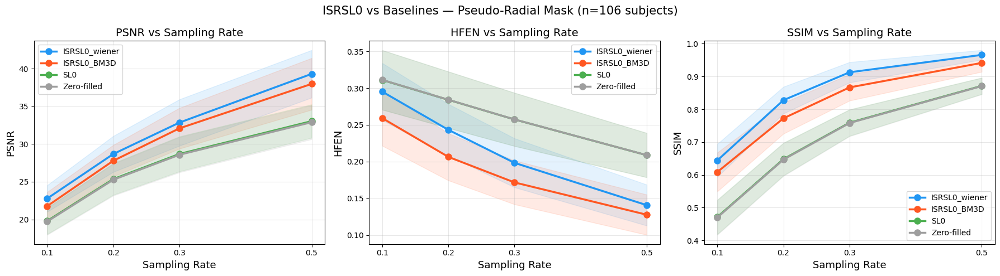

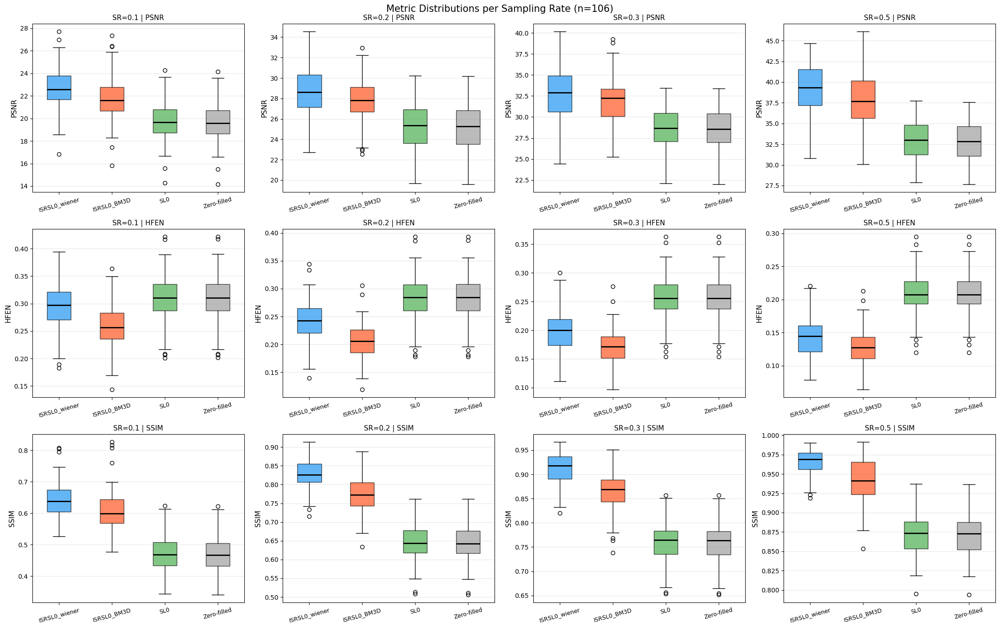

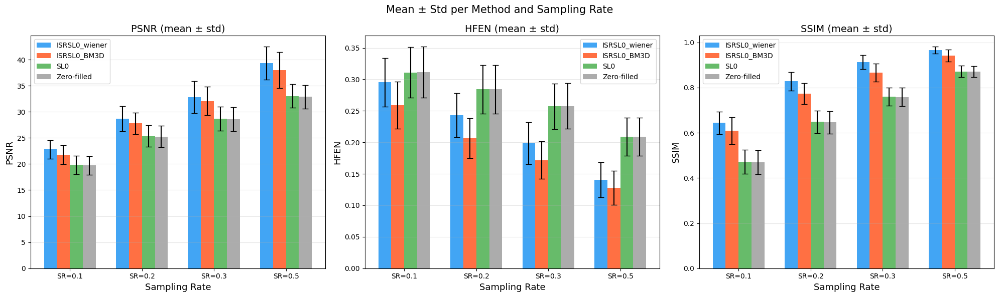


SUMMARY TABLE: Mean ± Std (n=106 subjects)
Sampling Rate        Method PSNR (mean±std) HFEN (mean±std) SSIM (mean±std)
       SR=0.1 ISRSL0_wiener    22.77 ± 1.76   0.295 ± 0.039   0.644 ± 0.050
       SR=0.1   ISRSL0_BM3D    21.77 ± 1.86   0.259 ± 0.038   0.609 ± 0.059
       SR=0.1           SL0    19.80 ± 1.76   0.311 ± 0.040   0.471 ± 0.053
       SR=0.1   Zero-filled    19.72 ± 1.76   0.311 ± 0.040   0.470 ± 0.053
       SR=0.2 ISRSL0_wiener    28.68 ± 2.38   0.243 ± 0.035   0.828 ± 0.041
       SR=0.2   ISRSL0_BM3D    27.78 ± 2.09   0.206 ± 0.032   0.772 ± 0.047
       SR=0.2           SL0    25.36 ± 2.10   0.284 ± 0.038   0.648 ± 0.050
       SR=0.2   Zero-filled    25.26 ± 2.11   0.284 ± 0.038   0.647 ± 0.050
       SR=0.3 ISRSL0_wiener    32.84 ± 3.08   0.198 ± 0.033   0.913 ± 0.031
       SR=0.3   ISRSL0_BM3D    32.08 ± 2.70   0.172 ± 0.030   0.867 ± 0.040
       SR=0.3           SL0    28.68 ± 2.32   0.257 ± 0.036   0.759 ± 0.040
       SR=0.3   Zero-filled    28.57 ± 2.34 

In [66]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob

# ========== LOAD ALL CSV FILES ==========
###### knee
files = {
    0.1: 'knee outputs/ISRSL0 results for Sampling Rate_0.1 _Mask_type_ pseudo_radial _for 199subjects.csv',
    0.2: 'knee outputs/ISRSL0 results for Sampling Rate_0.2 _Mask_type_ pseudo_radial _for 199subjects.csv',
    0.3: 'knee outputs/ISRSL0 results for Sampling Rate_0.3 _Mask_type_ pseudo_radial _for 199subjects.csv',
    0.5: 'knee outputs/ISRSL0 results for Sampling Rate_0.5 _Mask_type_ pseudo_radial _for 199subjects.csv',
}

#### brain:
files = {
   0.1: 'knee outputs/Brain ISRSL0 results for Sampling Rate_0.1 _Mask_type_ pseudo_radial _for 106subjects.csv',
   0.2: 'knee outputs/Brain ISRSL0 results for Sampling Rate_0.2 _Mask_type_ pseudo_radial _for 106subjects.csv',
   0.3: 'knee outputs/Brain ISRSL0 results for Sampling Rate_0.3 _Mask_type_ pseudo_radial _for 106subjects.csv',
   0.5: 'knee outputs/Brain ISRSL0 results for Sampling Rate_0.5 _Mask_type_ pseudo_radial _for 106subjects.csv',
}


# Load and tag with sampling rate
dfs = []
for sr, fname in files.items():
    df = pd.read_csv(fname)
    df['sampling_rate'] = sr
    dfs.append(df)

df_all = pd.concat(dfs, ignore_index=True)

# Keep only numeric subject rows (exclude MEAN rows)
df_all = df_all[pd.to_numeric(df_all['subject'], errors='coerce').notna()].copy()

# Drop hyperparameter columns
df_all = df_all.drop(columns=['lam_p', 'sigma_min', 'sigma_max'], errors='ignore')

# Clean method names
method_order = ['ISRSL0_wiener', 'ISRSL0_BM3D', 'SL0', 'Zero-filled']
method_labels = {
    'ISRSL0_wiener': 'ISRSL0_wiener',
    'ISRSL0_BM3D':   'ISRSL0_BM3D',
    'SL0':          'SL0',
    'Zero-filled':  'Zero-filled'
}
colors = {
    'ISRSL0_wiener': '#2196F3',
    'ISRSL0_BM3D':   '#FF5722',
    'SL0':          '#4CAF50',
    'Zero-filled':  '#9E9E9E'
}

sampling_rates = [0.1, 0.2, 0.3, 0.5]
metrics = ['PSNR', 'HFEN', 'SSIM']

# ========== FIGURE 1: LINE PLOTS — METRIC vs SAMPLING RATE ==========
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, metric in zip(axes, metrics):
    for method in method_order:
        means, stds = [], []
        for sr in sampling_rates:
            subset = df_all[(df_all['method'] == method) & (df_all['sampling_rate'] == sr)][metric]
            means.append(subset.mean())
            stds.append(subset.std())
        
        means = np.array(means)
        stds = np.array(stds)
        ax.plot(sampling_rates, means, 'o-', label=method_labels[method],
                color=colors[method], linewidth=2.5, markersize=8)
        ax.fill_between(sampling_rates, means - stds, means + stds,
                        alpha=0.12, color=colors[method])
    
    ax.set_xlabel('Sampling Rate', fontsize=13)
    ax.set_ylabel(metric, fontsize=13)
    ax.set_title(f'{metric} vs Sampling Rate', fontsize=14)
    ax.set_xticks(sampling_rates)
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.3)

plt.suptitle('ISRSL0 vs Baselines — Pseudo-Radial Mask (n=106 subjects)', fontsize=15)
plt.tight_layout()
plt.show()

# ========== FIGURE 2: BOX PLOTS PER SAMPLING RATE ==========
fig, axes = plt.subplots(3, 4, figsize=(22, 14))

for col, sr in enumerate(sampling_rates):
    df_sr = df_all[df_all['sampling_rate'] == sr]
    
    for row, metric in enumerate(metrics):
        ax = axes[row, col]
        data = [df_sr[df_sr['method'] == m][metric].values for m in method_order]
        bp = ax.boxplot(data, patch_artist=True, notch=False,
                        medianprops=dict(color='black', linewidth=2))
        
        for patch, method in zip(bp['boxes'], method_order):
            patch.set_facecolor(colors[method])
            patch.set_alpha(0.7)
        
        ax.set_xticks(range(1, 5))
        ax.set_xticklabels([method_labels[m] for m in method_order], rotation=15, fontsize=9)
        ax.set_ylabel(metric, fontsize=11)
        ax.set_title(f'SR={sr} | {metric}', fontsize=11)
        ax.grid(True, alpha=0.3, axis='y')

plt.suptitle('Metric Distributions per Sampling Rate (n=106)', fontsize=15)
plt.tight_layout()
plt.show()

# ========== FIGURE 3: BAR CHART — MEAN ± STD PER SR ==========
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
x = np.arange(len(sampling_rates))
width = 0.18

for ax, metric in zip(axes, metrics):
    for i, method in enumerate(method_order):
        means = [df_all[(df_all['method'] == method) & 
                        (df_all['sampling_rate'] == sr)][metric].mean() 
                 for sr in sampling_rates]
        stds = [df_all[(df_all['method'] == method) & 
                       (df_all['sampling_rate'] == sr)][metric].std() 
                for sr in sampling_rates]
        offset = (i - 1.5) * width
        ax.bar(x + offset, means, width, yerr=stds, capsize=4,
               label=method_labels[method], color=colors[method], alpha=0.85)
    
    ax.set_xlabel('Sampling Rate', fontsize=13)
    ax.set_ylabel(metric, fontsize=13)
    ax.set_title(f'{metric} (mean ± std)', fontsize=14)
    ax.set_xticks(x)
    ax.set_xticklabels([f'SR={sr}' for sr in sampling_rates])
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.3, axis='y')

plt.suptitle('Mean ± Std per Method and Sampling Rate', fontsize=15)
plt.tight_layout()
plt.show()

# ========== SUMMARY TABLE: MEAN ± STD ==========
print("\n" + "="*90)
print("SUMMARY TABLE: Mean ± Std (n=106 subjects)")
print("="*90)

rows = []
for sr in sampling_rates:
    for method in method_order:
        subset = df_all[(df_all['method'] == method) & (df_all['sampling_rate'] == sr)]
        rows.append({
            'Sampling Rate': f'SR={sr}',
            'Method': method_labels[method],
            'PSNR (mean±std)': f"{subset['PSNR'].mean():.2f} ± {subset['PSNR'].std():.2f}",
            'HFEN (mean±std)': f"{subset['HFEN'].mean():.3f} ± {subset['HFEN'].std():.3f}",
            'SSIM (mean±std)': f"{subset['SSIM'].mean():.3f} ± {subset['SSIM'].std():.3f}",
        })

df_summary = pd.DataFrame(rows)
print(df_summary.to_string(index=False))
df_summary.to_csv('summary_table.csv', index=False)
print("\n💾 Summary saved to 'summary_table.csv'")
